In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt
import xarray as xr
import pandas as pd
import os
import sys
import jinja2
import dataclasses
#import hvplot.xarray
print(sys.path)
import pytropd.functions as tropdf
import pytropd.metrics as tropdm
from own_functions import (vertical_weights, weights, calc_jet_lats, calc_jet_lats_tropd, calc_theta,
    get_setup_from, get_ty_from, get_tmax_from, calc_baroclinic_slope
)
from own_functions import r_air, kappa, kappai, g0, p00, r_e

from visualization import (plot_zm_climatologies, plot_transports, plot_hor_fields, 
    plot_ep_flux_div, plot_EKE_spectral, plot_spectral_vd, plot_hayashi_spectra,
    plot_wave_persistency, plot_theta_profiles, plot_t_profiles, plot_transports,
    plot_theta_u_zm_clim, plot_bc_slope_u_zm_clim)
from relax_visualization import (Params_HS_PK, Forcing_params, 
    g_func, tteh_cc_tropics, tteh_waves, tteh_mons, relax_submodel
)
import dataclasses
from dataclasses import dataclass

import warnings
warnings.simplefilter(action='ignore')

pplt.rc.update({
    'figure.dpi': 100,
    'figure.figsize': (8,6),
    'savefig.dpi': 150,
})

['/home/b/b381739/masterarbeit', '/home/b/b381739/masterarbeit', '/home/b/b381739/code', '/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python39.zip', '/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9', '/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/lib-dynload', '', '/home/b/b381739/.local/lib/python3.9/site-packages', '/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/site-packages']


In [28]:
#exp_name = 'EMIL_sfc_w2_a4' 
#exp_name = 'EMIL_vareps_00'
#exp_name = 'EMIL_SW_l0_w00'
#exp_name = 'EMIL_HS_l6_w00'
exp_name = 'EMIL_SW90_f070'
#exp_name = 'EMIL_SW_spinup'
#exp_name = 'EMIL_SW90_f065'
#exp_name =   'EMIL_HSl0_dy60'
#exp_name = 'W2h85SW90_f080'

ref_name =   'EMIL_SW90_f080'

ylims=[1013,10]
yscale='linear'
plot_format = 'png'

work_path = '/work/bd1022/b381739'
home_path = '/home/b/b381739/'
inpath = f'{work_path}/{exp_name}/postprocessed'
inpath_ref = f'{work_path}/{ref_name}/postprocessed'
outpath = f'{home_path}/plots' 

os.chdir(inpath)

ds_zm = xr.open_dataset(f'{exp_name}_zm_pp.nc').sortby('time')
ds_pls = xr.open_dataset(f'{exp_name}_pl_sel.nc').sortby('time')
ds_tp = xr.open_dataset(f'{exp_name}_transports_pp.nc').sortby('time') #.sel(time=slice('2000', '2003'))
ds_tp_int = xr.open_dataset(f'{exp_name}_transports_int_pp.nc').sortby('time')

os.chdir(inpath_ref)

ds_zm_ref = xr.open_dataset(f'{ref_name}_zm_pp.nc').sortby('time')
ds_pls_ref = xr.open_dataset(f'{ref_name}_pl_sel.nc').sortby('time')
ds_tp_ref = xr.open_dataset(f'{ref_name}_transports_pp.nc').sortby('time')
ds_tp_int_ref = xr.open_dataset(f'{ref_name}_transports_int_pp.nc').sortby('time')

os.chdir(outpath)
ds_zm

<xarray.Dataset>
Dimensions:   (lat: 64, plev: 90, time: 366)
Coordinates:
  * time      (time) datetime64[ns] 2000-01-01 2000-01-02 ... 2000-12-31
  * plev      (plev) float32 0.009946 0.03183 0.05808 ... 967.4 995.7 1.009e+03
  * lat       (lat) float32 87.86 85.1 82.31 79.53 ... -82.31 -85.1 -87.86
Data variables:
    um1       (time, plev, lat) float32 ...
    vm1       (time, plev, lat) float32 ...
    vervel    (time, plev, lat) float32 ...
    tm1       (time, plev, lat) float32 ...
    aps       (time, lat) float32 ...
    geopot_p  (time, plev, lat) float32 ...
    eke       (time, plev, lat) float32 ...

### Calculation of vertical weights

Text(0.5, 0, 'pressure level number')

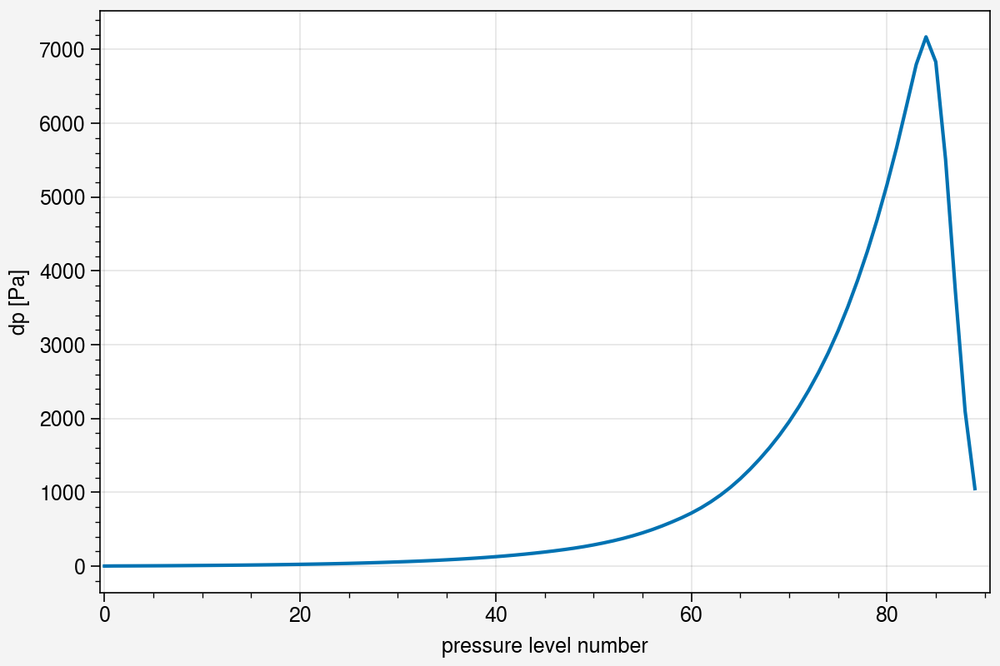

In [4]:
vert_weights = vertical_weights(ds_zm)
total_weights = weights(ds_zm)
fig, ax = pplt.subplots(figsize=(6,4))
ax.plot(np.arange(0,vert_weights.size,1), vert_weights*100)
ax.set_ylabel('dp [Pa]')
ax.set_xlim([-0.5, 90.5])
ax.set_xlabel('pressure level number')
#fig.savefig('mean_dp_plev.png')

In [5]:
setup = get_setup_from(exp_name)
params = Params_HS_PK()
params.Ty = get_ty_from(exp_name)
params.T1 = get_tmax_from(exp_name)
t_equ = relax_submodel(setup, np.radians(ds_zm.lat.values), ds_zm.plev.values*100, p=params)

setup = get_setup_from(ref_name)
params_ref = Params_HS_PK()
params_ref.Ty = get_ty_from(ref_name)
params_ref.T1 = get_tmax_from(ref_name)
t_equ_ref = relax_submodel(setup, np.radians(ds_zm_ref.lat.values), ds_zm_ref.plev.values*100, p=params_ref)

print(t_equ.weighted(total_weights).mean())
print(t_equ_ref.weighted(total_weights).mean())

<xarray.DataArray ()>
array(226.84909547)
<xarray.DataArray ()>
array(225.04296445)


In [6]:
t_equ_pksw = relax_submodel('PKSW', np.radians(ds_zm.lat.values), ds_zm.plev.values*100)
t_equ_pk = relax_submodel('PK', np.radians(ds_zm.lat.values), ds_zm.plev.values*100)
t_equ_pk_nv = relax_submodel('PK', np.radians(ds_zm.lat.values), ds_zm.plev.values*100, no_polar_vortex=True)


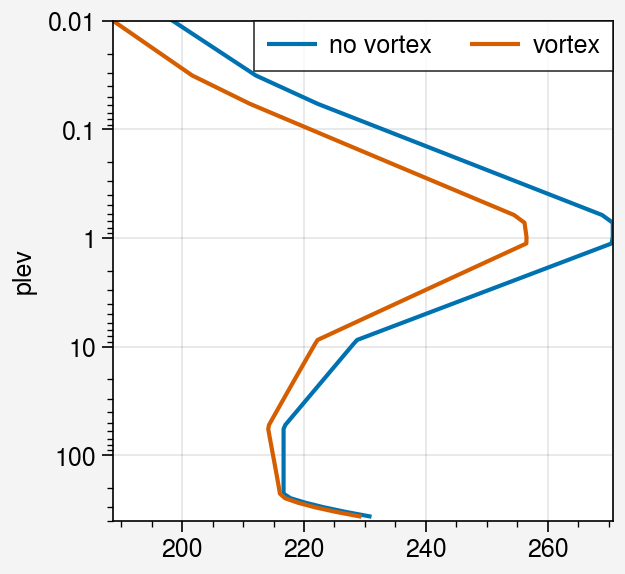

In [7]:
fig, ax = pplt.subplots()
lat_bound = 90
t_equ_1 = t_equ_pk_nv.sel(plev=slice(0,400), lat=slice(lat_bound,-lat_bound))
t_equ_2 = t_equ_pk.sel(plev=slice(0,400), lat=slice(lat_bound,-lat_bound))

ax.plot(t_equ_1.weighted(np.cos(np.radians(t_equ_1.lat))).mean(['lat']), t_equ_1.plev, label='no vortex')
ax.plot(t_equ_2.weighted(np.cos(np.radians(t_equ_2.lat))).mean(['lat']), t_equ_2.plev, label='vortex')

ax.set_ylim([400,0.01])
ax.set_yscale('log')
ax.legend()
fig.savefig(f'Mean_strat_t_equ_vortex_no_vortex_lats0-{lat_bound}.{plot_format}')

### Streamfunction calculation via TropD package

function: 

$ \frac{2\pi a cos \phi}{g} \int_{0}^{p} v dp $

In [8]:
ds = ds_zm.mean('time')
psi = tropdf.TropD_Calculate_StreamFunction(ds.vm1.values.T, 
                                            ds.lat.values,
                                            ds.plev.values)

r_air = 287
cp = 1003
rho_0 = 1.225
n = 1.2e-2 # Brunt-Väisälä frequency s^-1, strat: n^2 = 4e-4 s^-2
scale_height = 7000

ds_zm['psi'] = (['plev', 'lat'], psi.T)
ds_zm['theta'] = calc_theta(ds_zm)
ds_tp['vtheta_et'] = ds_tp.vT_et * (p00/ds_zm.plev) ** (r_air/cp)
ds_zm['z_logp'] = - scale_height * np.log(ds_zm.plev/p00)

nlevs = ds_zm.plev.size
ds_sel = ds_zm.isel(plev=slice(1,nlevs-1))
ds = ds_zm 

def calc_da_derivative(da, coord, coord_name=None):
    """
    Calculates central differences in the interior, backward/forward differences at the borders.
    """
    if coord_name is None:
        coord_name=coord.name
        
    dda = calc_array_deltas_default(da, coord_name)
    dcoord = calc_array_deltas_default(coord, coord_name)
    
    dda_dcoord = dda/dcoord

    dda_dcoord_fw = calc_remaining_array_deltas_forward(da, coord_name)/calc_remaining_array_deltas_forward(coord, coord_name)
    dda_dcoord_bw = calc_remaining_array_deltas_backward(da, coord_name)/calc_remaining_array_deltas_backward(coord, coord_name)

    dda_dcoord_interm = xr.where(dda_dcoord.isnull(), dda_dcoord_fw, dda_dcoord)
    dda_dcoord_final = xr.where(dda_dcoord_interm.isnull(), dda_dcoord_bw, dda_dcoord)

    if coord_name == 'plev':
        dda_dcoord = dda_dcoord/100
    print(dda_dcoord_fw)
    return dda_dcoord

def calc_array_deltas(da, coord_name):
    """
    Calculates central differences in the interior, forward/backward differences at the borders.
    Starts at i=0 
    """
    dda_begin = da.isel({coord_name:1}).values - da.isel({coord_name:0})
    dda_mid = (da.shift({coord_name:1}) - da.shift({coord_name:-1})).isel({coord_name:slice(1,-1)})
    dda_end = da.isel({coord_name:-1}) - da.isel({coord_name:-2}).values
    
    dda = xr.concat([dda_begin, dda_mid, dda_end], dim=coord_name)    
    
    return dda

def calc_remaining_array_deltas_forward(da, coord_name):
    """
    Calculates central differences in the interior, forward/backward differences at the borders.
    Starts at i=0 
    """
    da_fw = da.where(np.isnan(da.shift({coord_name:-1})), drop=False)
    da_fw2 = da.where(np.isnan(da.shift({coord_name:-2})) & da.shift({coord_name:-1}).notnull(), drop=False)
    dda_fw = (da_nans_fw2.shift({coord_name:1}) - da_nans_fw) 

    return dda_fw

def calc_remaining_array_deltas_backward(da, coord_name):
    """
    Calculates central differences in the interior, forward/backward differences at the borders.
    Starts at i=0 
    """
    da_bw = da.where(np.isnan(da.shift({coord_name:1})), drop=False)
    da_bw2 = da.where(np.isnan(da.shift({coord_name:2})) & da.shift({coord_name:1}).notnull(), drop=False)
    dda_bw = (da_nans_fw2.shift({coord_name:-1}) - da_nans_fw)  

    return dda_bw

dtheta_dp = calc_da_derivative(ds.theta, ds.plev)
vtheta_et_scaled_dp = calc_da_derivative(ds_tp.vtheta_et.mean('time')/dtheta_dp.mean('time'), ds.plev)

#dtheta_dp = ds.theta.differentiate('plev') / 100
#vtheta_et_scaled_dp = (ds_tp.vtheta_et.mean('time')/dtheta_dp.mean('time')).differentiate('plev') / 100

ds_zm['psi_star'] = (ds_zm.psi - np.cos(np.radians(ds_zm.lat)) * 2 * np.pi * r_e / g0 
                     * ds_tp.vtheta_et.mean('time')/dtheta_dp.mean('time'))

ds_zm['v_star'] = ds_zm.vm1.mean('time') - vtheta_et_scaled_dp

psi_alt = tropdf.TropD_Calculate_StreamFunction(ds_zm.v_star.values.T, 
                                            ds_zm.lat.values,
                                            ds_zm.plev.values)

ds_zm['psi_star_alt'] = (['plev', 'lat'], psi_alt.T)

NameError: name 'calc_array_deltas_default' is not defined

In [ ]:
da = ds_zm.theta
coord = ds_zm.plev * 100
coord_name = None

if coord_name is None:
    coord_name=coord.name

da_nans = da.where(np.isnan(da), drop=True)

dda = calc_array_deltas(da, coord_name)
dcoord = calc_array_deltas(coord, coord_name)

dda_dcoord = dda/dcoord

dda_dcoord_final.mean('time').sel(plev=slice(50,1000)).plot.contourf(levels=np.arange(0, -0.02, -0.001))

In [ ]:
dda_dcoord.mean('time').sel(plev=slice(80,1000)).plot()

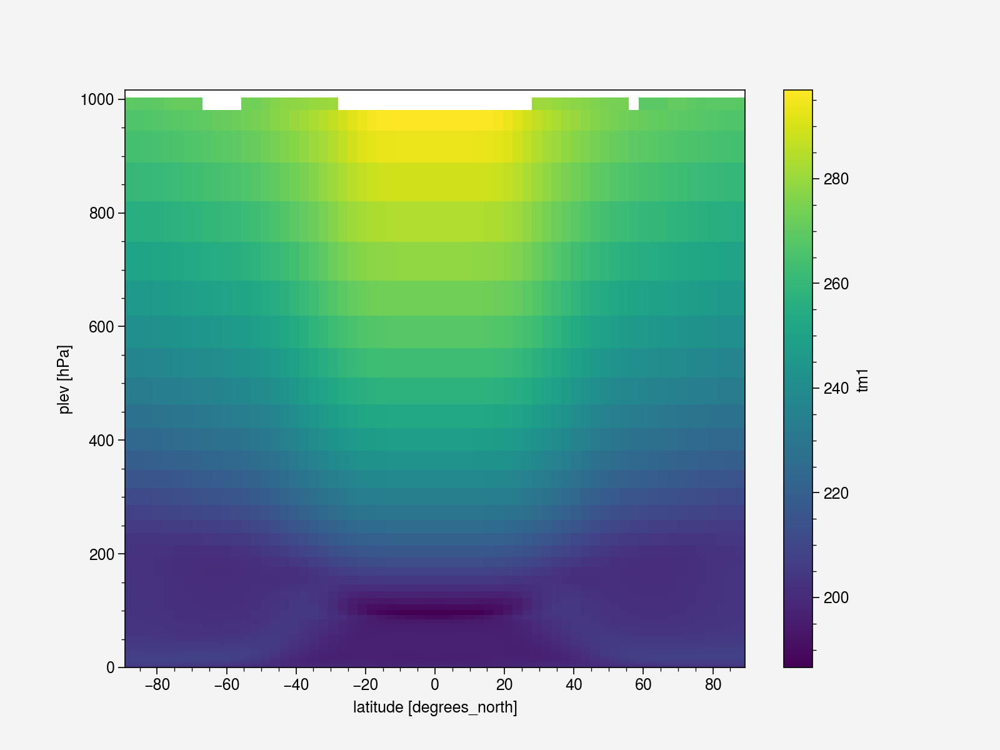

In [9]:
ds_zm.tm1.mean('time').plot()

In [66]:
da_nans_both = da.where(np.isnan(da.shift({coord_name:-1})) & np.isnan(da.shift({coord_name:1})), drop=True)

In [67]:
da_nans_fw = da.where(np.isnan(da.shift({coord_name:-1})), drop=False)
#da_nans_fw  = da_nans_fw.sel({coord_name:slice(da_nans_fw[coord_name][0], da_nans_fw[coord_name][1])})
da_nans_fw2 = da.where(np.isnan(da.shift({coord_name:-2})) & da.shift({coord_name:-1}).notnull(), drop=False)

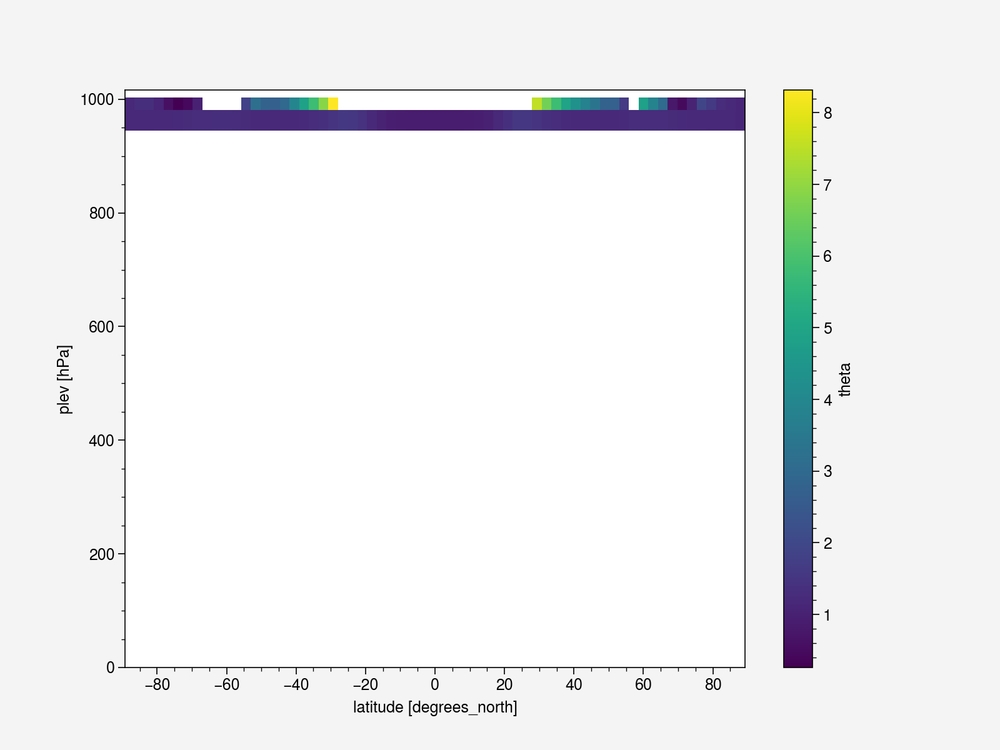

In [68]:
da_nans_fw_final = (da_nans_fw2.shift({coord_name:1}) - da_nans_fw)  #.where((da_nans_fw2.values - da_nans_fw).notnull(),drop=True)
da_nans_fw_final.mean('time').plot()

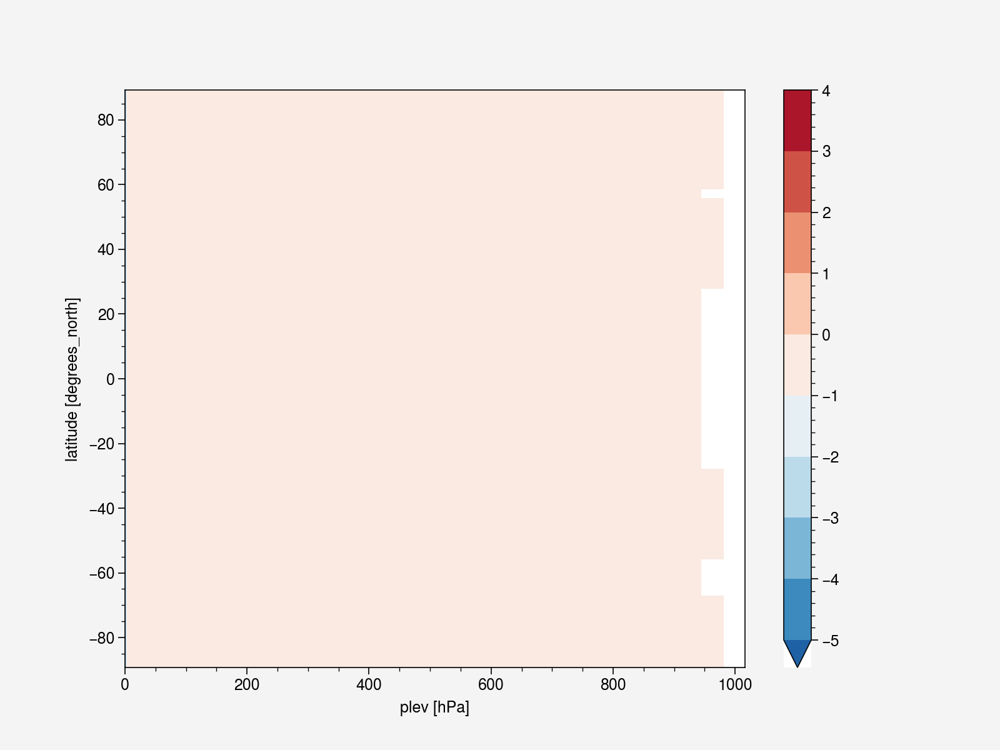

In [81]:
dda_dcoord.mean('time').plot(levels=np.arange(-5,5,1))

(array([  46784.,       0.,       0.,   46784.,       0.,       0.,
              0.,   46784.,   46784., 3933559.]),
 array([-743.5059  , -667.97034 , -592.4347  , -516.8991  , -441.3635  ,
        -365.82788 , -290.2923  , -214.75668 , -139.22108 ,  -63.68548 ,
          11.850128], dtype=float32),
 <BarContainer object of 10 artists>)

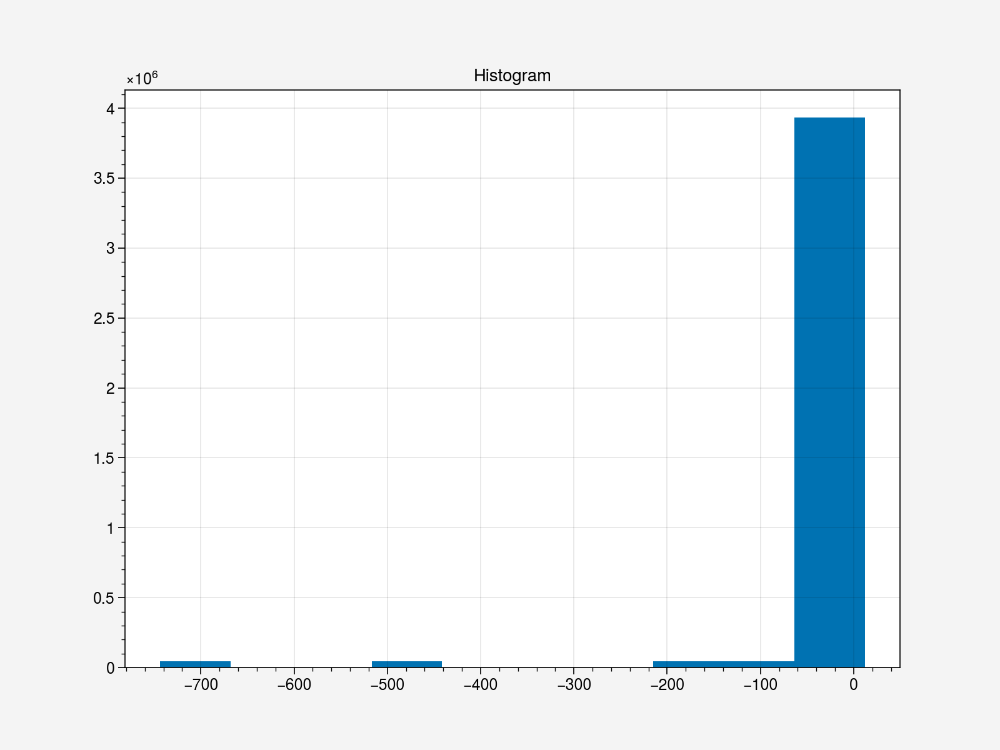

In [77]:
dda_dcoord_final = xr.where(dda_dcoord.isnull(), da_nans_fw_final, dda_dcoord)
dda_dcoord_final.plot()

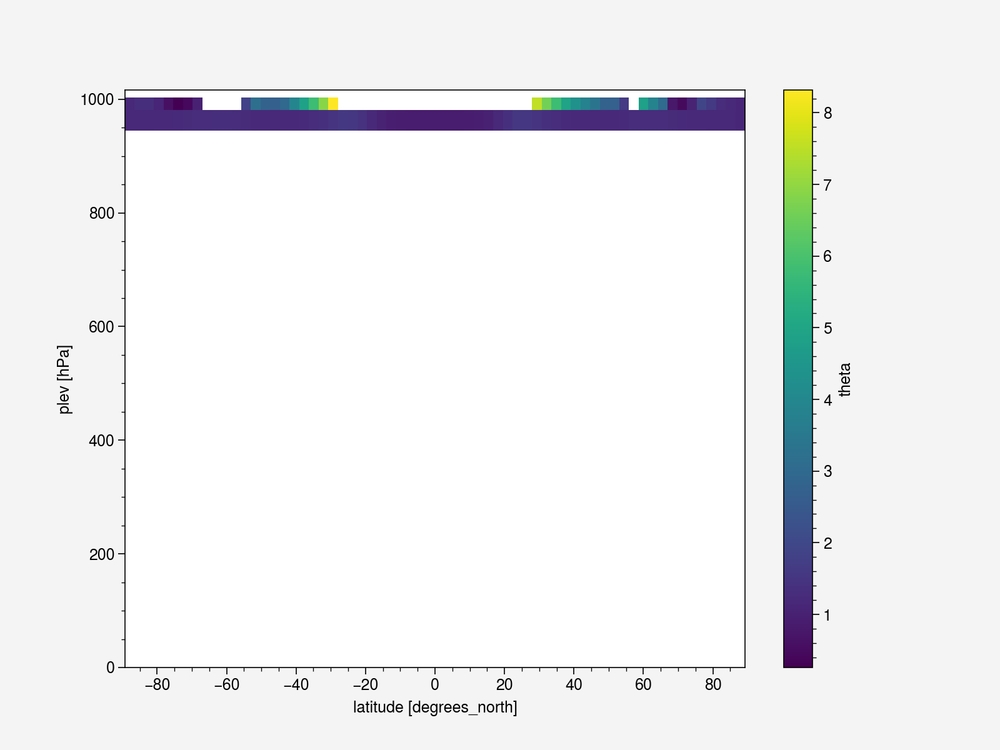

In [70]:
da_nans_fw_final.mean('time').plot()

In [71]:
test = da.isel(plev=slice(0,3), time=0, lat=slice(0,2))
test.isel({'plev':slice(0,-1)})

<xarray.DataArray 'theta' (plev: 2, lat: 2)>
array([[5443.4565, 5443.9062],
       [3881.8408, 3881.8438]], dtype=float32)
Coordinates:
    time     datetime64[ns] 2000-01-01
  * plev     (plev) float32 0.009946 0.03183
  * lat      (lat) float32 87.86 85.1

In [72]:
test.shift(plev=1)

<xarray.DataArray 'theta' (plev: 3, lat: 2)>
array([[      nan,       nan],
       [5443.4565, 5443.9062],
       [3881.8408, 3881.8438]], dtype=float32)
Coordinates:
    time     datetime64[ns] 2000-01-01
  * plev     (plev) float32 0.009946 0.03183 0.05808
  * lat      (lat) float32 87.86 85.1

In [11]:
ds = ds_zm_ref.mean('time')
psi = tropdf.TropD_Calculate_StreamFunction(ds.vm1.values.T, 
                                            ds.lat.values,
                                            ds.plev.values)
ds_zm_ref['psi'] = (['plev', 'lat'], psi.T)
ds_zm_ref['theta'] = calc_theta(ds_zm_ref)

### Baroclinic Slope

In [50]:
bc_slope, dtheta_dy, dtheta_dlogp = calc_baroclinic_slope(ds_zm)

In [53]:
nlevs = ds_zm.plev.size
nlats = ds_zm.lat.size

bc_slope = calc_baroclinic_slope(ds_zm)[0].to_dataset(name='bc_slope')
#ds_zm = xr.merge([bc_slope, ds_zm], compat='override', join='outer')

bc_slope_ref = calc_baroclinic_slope(ds_zm_ref)[0].to_dataset(name='bc_slope')
#ds_zm_ref = xr.merge([bc_slope_ref, ds_zm_ref], compat='override', join='left')

#bc_slope_ref.bc_slope.isel(z_logp=slice(0,nlevs-4)).mean('time').plot()
#plt.yscale('linear')
#plt.ylim([0,20000])
#plt.savefig(f'{exp_name}_baroclinic_slope_logp.{plot_format}')

In [ ]:
for i in range(88):
    print(bc_slope.z_logp.values[i])
    print(ds_zm.plev.values[i+1])
    print()

In [1]:
exp_name

NameError: name 'exp_name' is not defined

## Climatologies

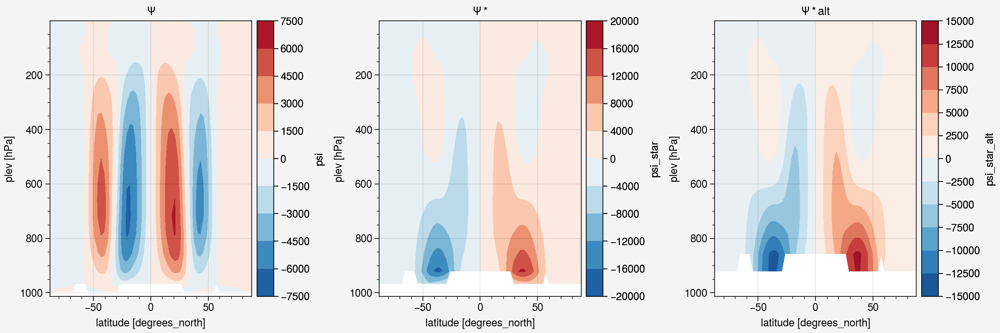

In [97]:
def plot_TEM_psi(ds):

    fig, ax = pplt.subplots(figsize=(12,4), ncols=3, share=False)

    (ds.psi/r_e).plot.contourf(ax=ax[0], levels=12)
    ax[0].set_title(r'$\Psi$')
    (ds.psi_star/r_e).plot.contourf(ax=ax[1], levels=12)
    ax[1].set_title(r'$\Psi*$')
    (ds.psi_star_alt/r_e).plot.contourf(ax=ax[2], levels=12)
    ax[2].set_title(r'$\Psi* alt$')
    for a in ax:
        a.set_ylim(ylims)
        
    return fig, ax 

fig, ax = plot_TEM_psi(ds_zm)

fig.savefig(f'{exp_name}_psi_psi_star_comp_wo_r_e.{plot_format}')

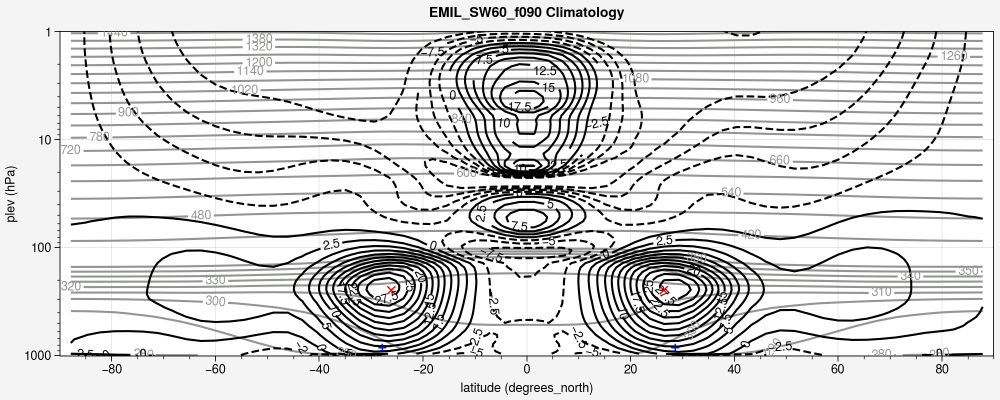

In [73]:
ds = ds_zm
yscale='log'

fig, ax = plot_theta_u_zm_clim(ds.mean('time'), yscale=yscale)
fig.suptitle(f'{exp_name} Climatology')
fig.savefig(f'{exp_name}_clim_theta.{plot_format}')


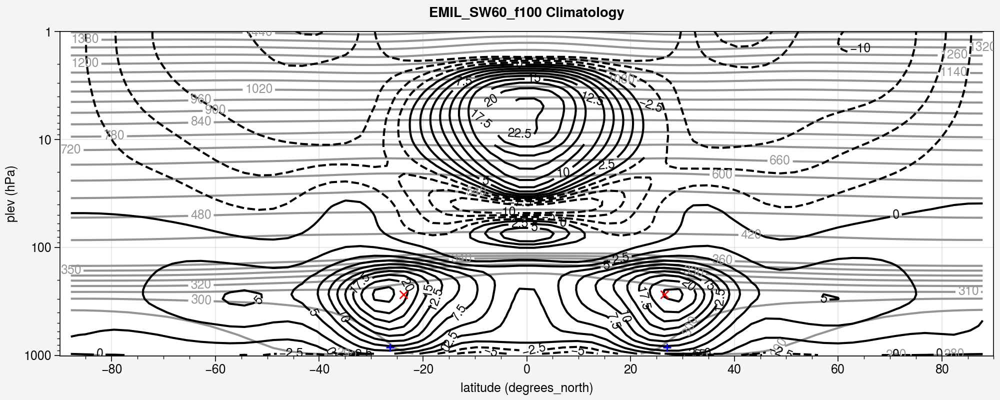

In [74]:
ds = ds_zm_ref #.sel(time=slice('01-2000','06-2000'))

fig, ax = plot_theta_u_zm_clim(ds.mean('time'), yscale=yscale)
fig.suptitle(f'{ref_name} Climatology')

fig.savefig(f'{ref_name}_clim_theta.{plot_format}')


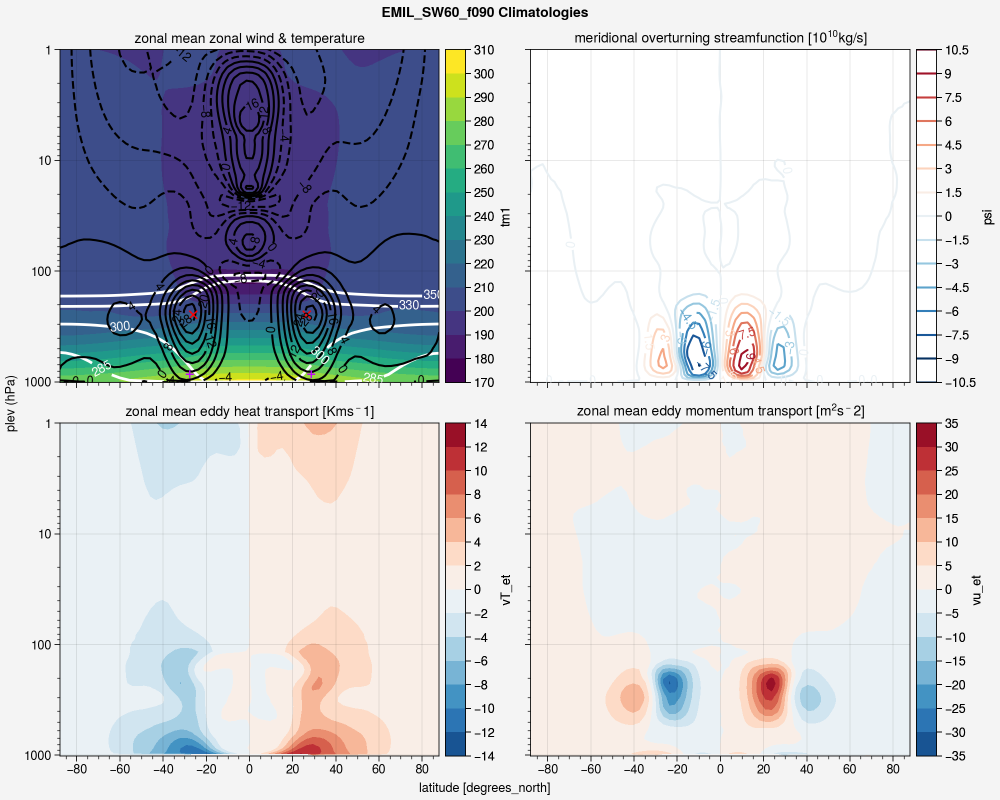

In [75]:
fig, ax, lat_stj, lat_edj = plot_zm_climatologies(ds_zm, ds_tp, yscale=yscale)
fig.suptitle(f'{exp_name} Climatologies')
fig.save(f'{exp_name}_zm_fields.{plot_format}')

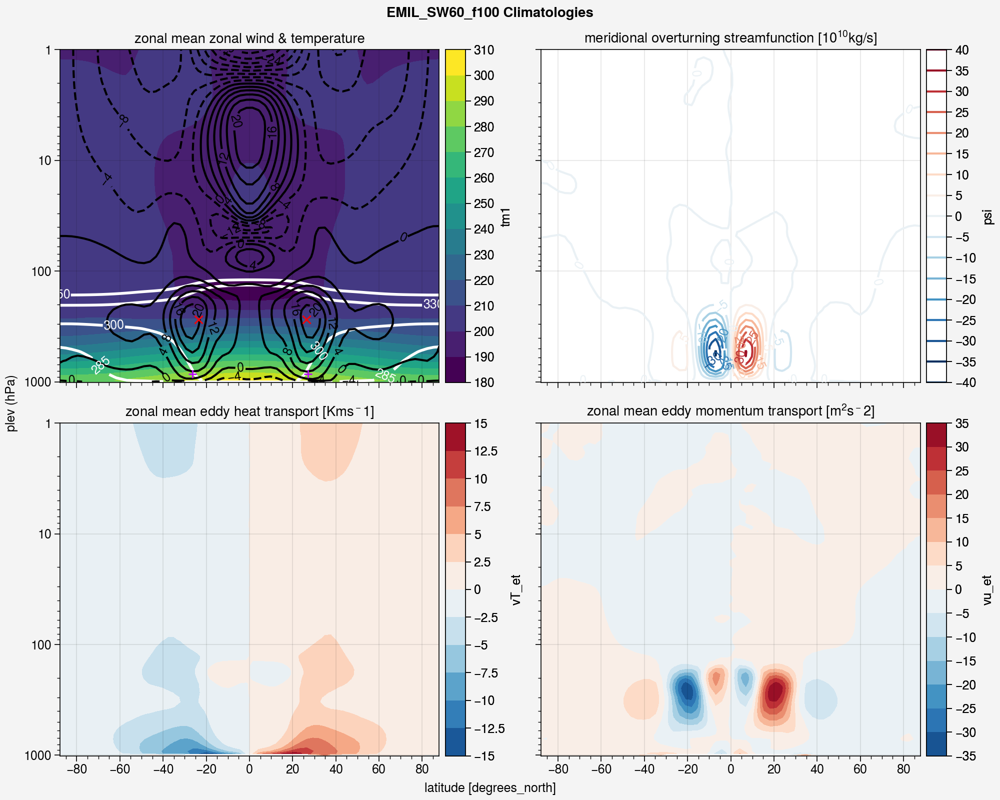

In [76]:
fig, ax = plot_zm_climatologies(ds_zm_ref, ds_tp_ref, yscale=yscale)[:2]
fig.suptitle(f'{ref_name} Climatologies')
fig.save(f'{ref_name}_zm_fields.{plot_format}')

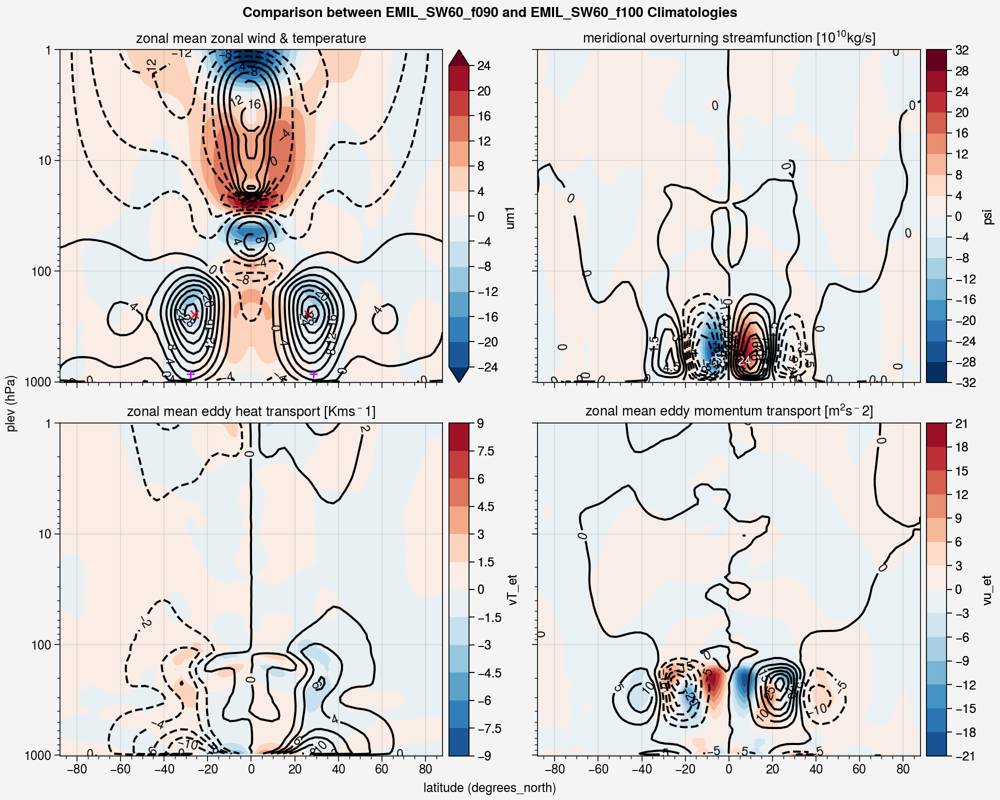

In [77]:
fig, ax = plot_zm_climatologies(ds_zm, ds_tp, ds_zm_ref, ds_tp_ref, yscale=yscale)[:2]
fig.suptitle(f'Comparison between {exp_name} and {ref_name} Climatologies')
fig.save(f'{exp_name}-ref_zm_fields.{plot_format}')

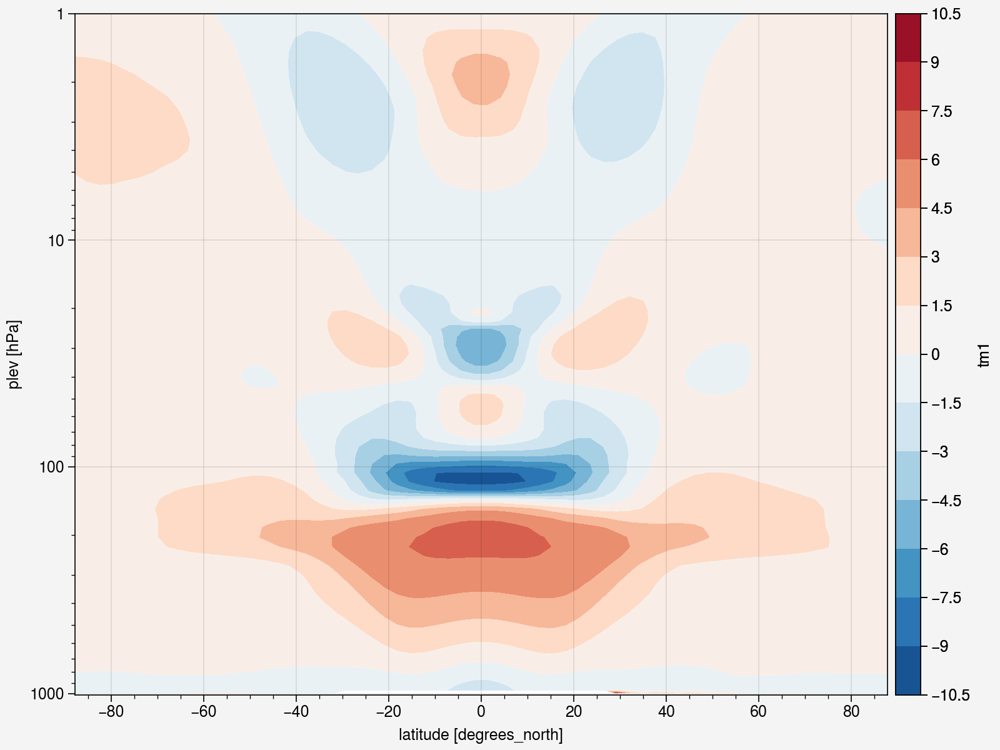

In [78]:
ylims=[1013,1]
fig, ax = pplt.subplots(figsize=(8,6))
(ds_zm.mean(['time']) - ds_zm_ref.mean(['time'])).tm1.plot.contourf(levels=15, yscale=yscale, ylim=ylims)
fig.save(f'{exp_name}-{ref_name}_zm_temperature.{plot_format}')

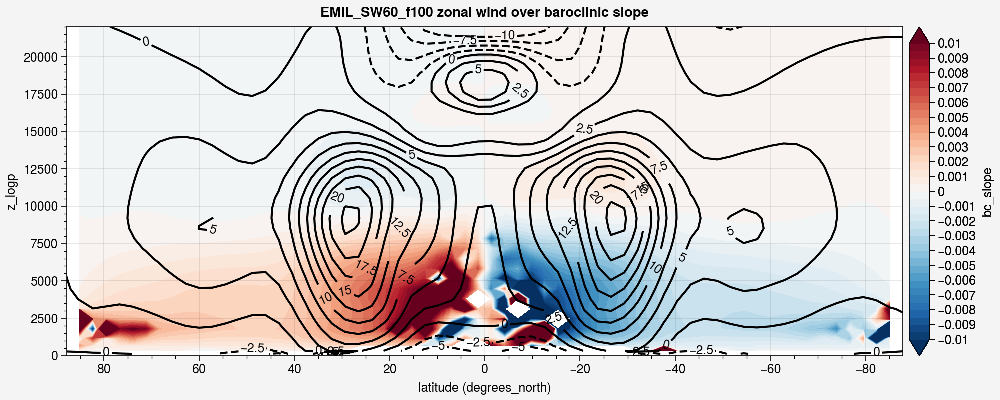

In [61]:
fig, ax = plot_bc_slope_u_zm_clim(ds_zm, bc_slope)
fig.suptitle(f'{exp_name} zonal wind over baroclinic slope')
fig.savefig(f'{exp_name}_bc_slope_u.{plot_format}')

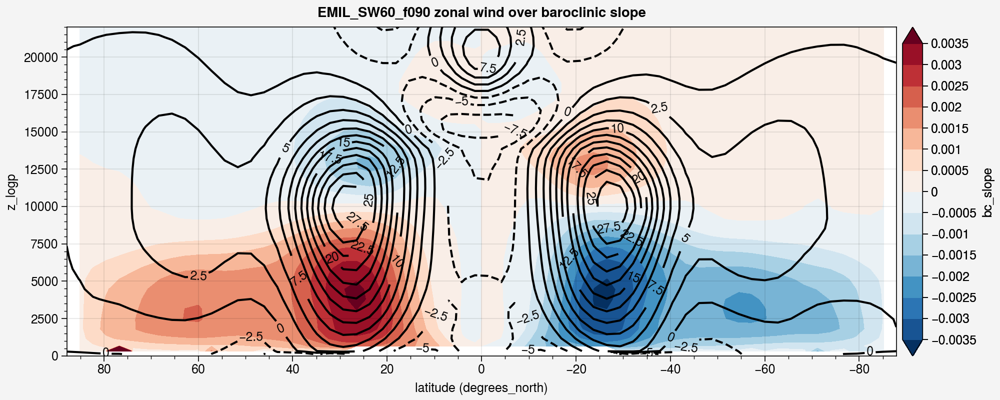

In [63]:
fig, ax = plot_bc_slope_u_zm_clim(ds_zm_ref, bc_slope_ref)
fig.suptitle(f'{ref_name} zonal wind over baroclinic slope')
fig.savefig(f'{ref_name}_bc_slope_u.{plot_format}')

## Theta Profiles


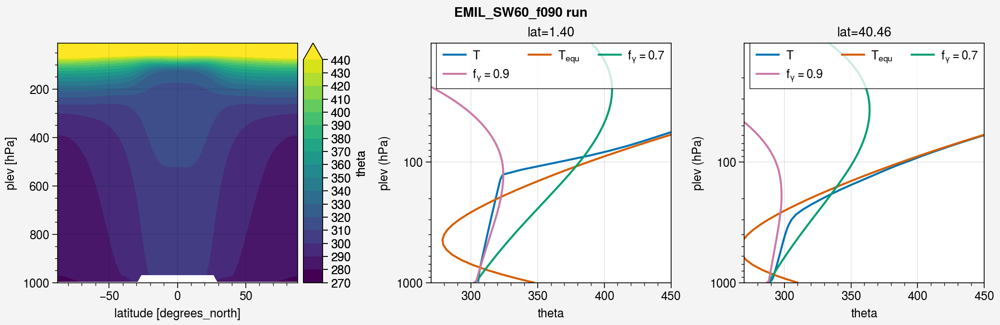

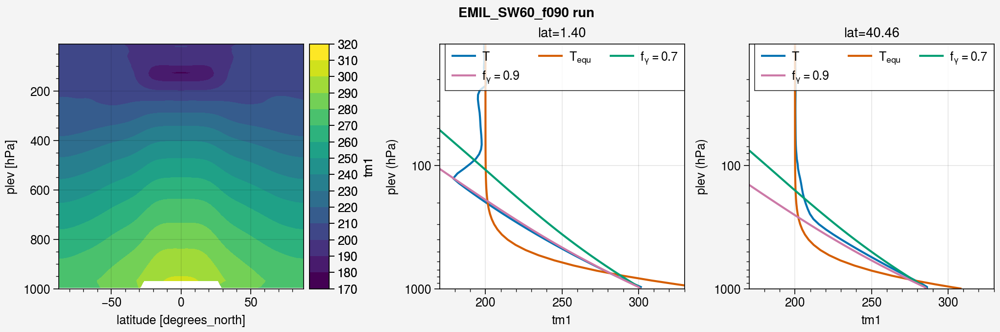

In [79]:
fig, ax = plot_theta_profiles(ds_zm.sel(plev=slice(10,1000)), exp_name, fgammas=[0.7, 0.9])
fig2, ax2 = plot_t_profiles(ds_zm.sel(plev=slice(10,1000)), exp_name, fgammas=[0.7, 0.9])
fig2.savefig(f'{exp_name}_t_cmp.{plot_format}')

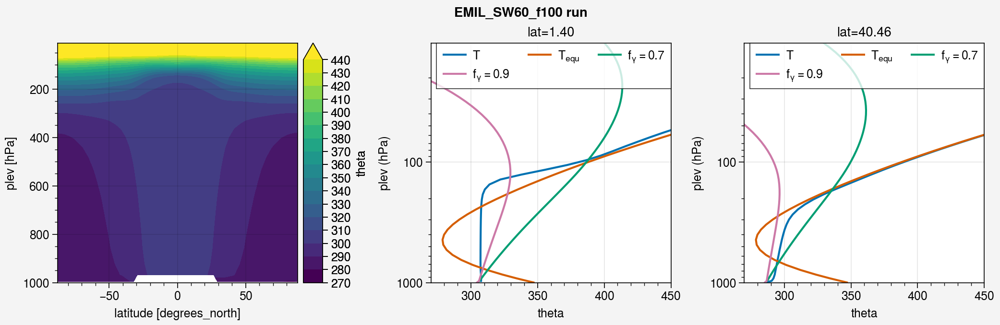

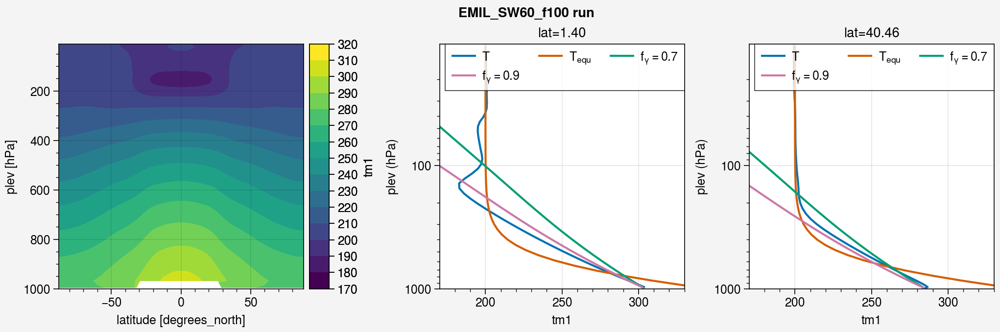

In [80]:
fig, ax = plot_theta_profiles(ds_zm_ref.sel(plev=slice(10,1000)), ref_name, fgammas=[0.7, 0.9])
fig2, ax2 = plot_t_profiles(ds_zm_ref.sel(plev=slice(10,1000)), ref_name, fgammas=[0.7, 0.9])
fig2.savefig(f'{ref_name}_t_cmp.{plot_format}')

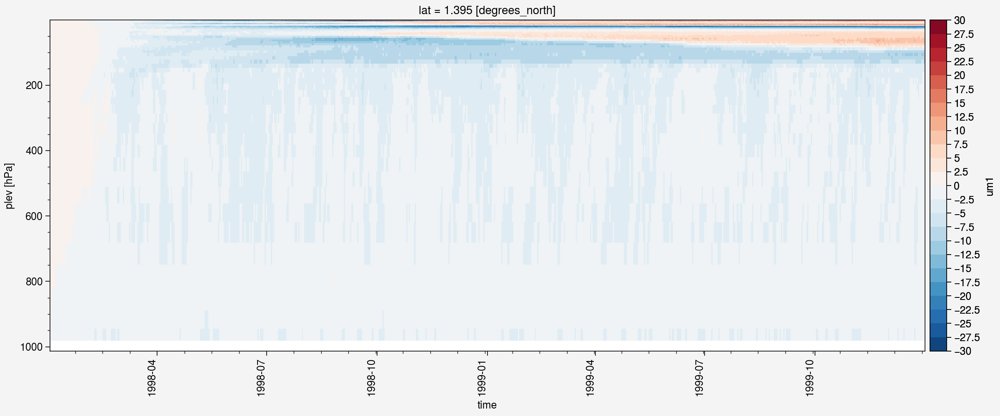

In [34]:
ds = ds_zm.sel(lat=0, method='nearest')
fig, ax = pplt.subplots(figsize=(12,5))
ds.um1.T.plot(ax=ax, levels=np.arange(-30,30.1,2.5))
ax.set_ylim(ylims)
fig.savefig(f'{exp_name}_u_eq_evolution.{plot_format}')

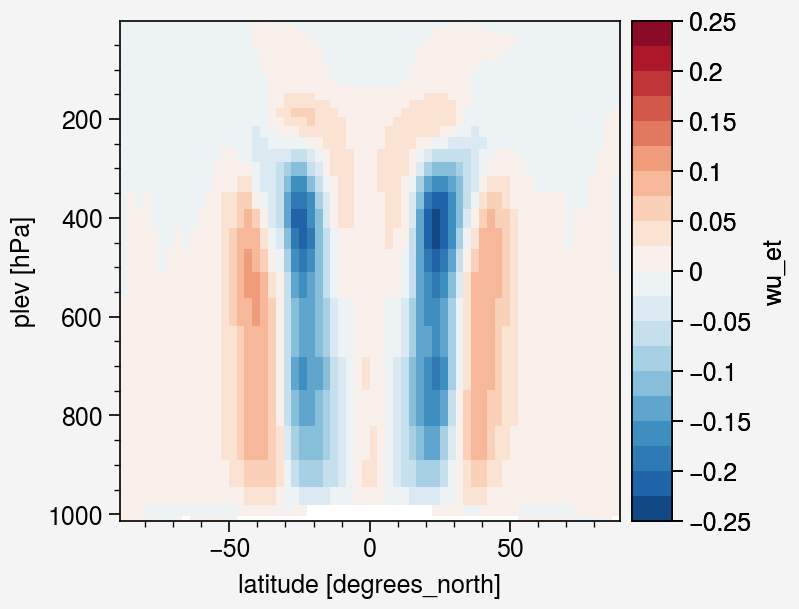

In [35]:
fig, ax = pplt.subplots()
ds_tp.wu_et.mean('time').plot(ax=ax, levels=20)
ax.set_ylim(ylims)
fig.savefig(f'{exp_name}_wuet_clim.{plot_format}')

Text(0.5, 1.0, 'Zonal mean vertical velocity [Pa/s]')

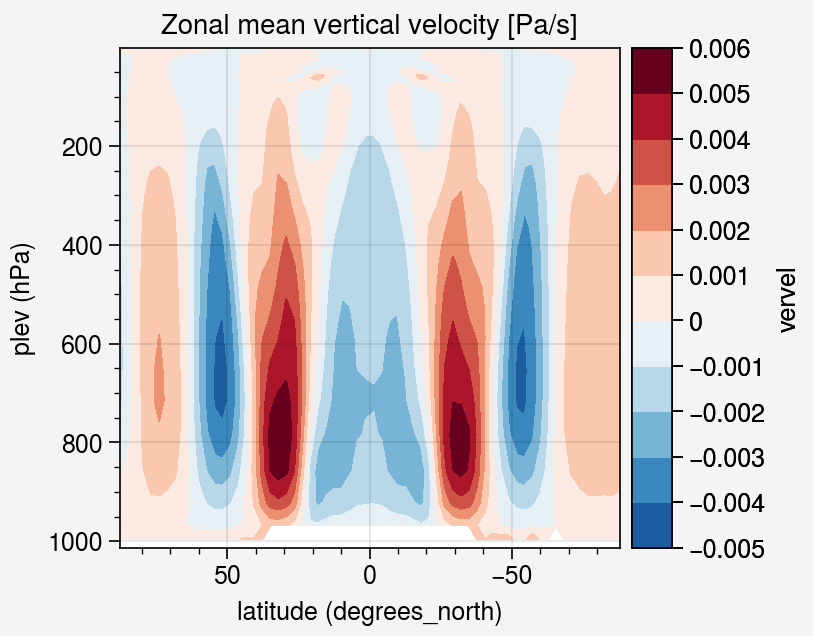

In [36]:
fig, ax = pplt.subplots()

ax.contourf(ds_zm.lat, ds_zm.plev, ds_zm.vervel.mean('time'), colorbar='r')
ax.set_ylim(ylims)
ax.set_title('Zonal mean vertical velocity [Pa/s]')


Text(0.5, 1.0, 'Zonal mean meridional velocity [Pa/s]')

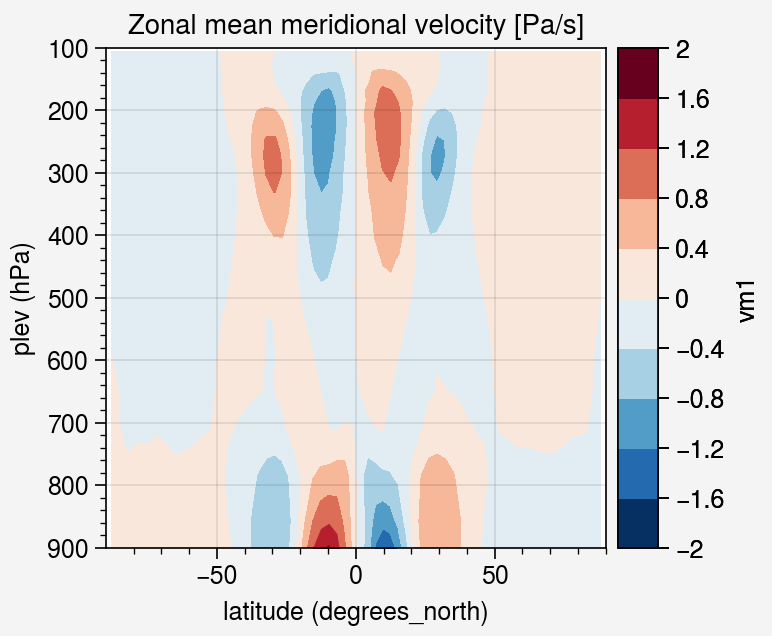

In [37]:
fig, ax = pplt.subplots()
ds = ds_zm.sel(plev=slice(100,950))

ax.contourf(ds.lat, ds.plev, ds.vm1.mean('time'), colorbar='r')
ax.set_ylim([900,100])
ax.set_xlim([-90,90])
ax.set_title('Zonal mean meridional velocity [Pa/s]')


(1013.0, 1.0)

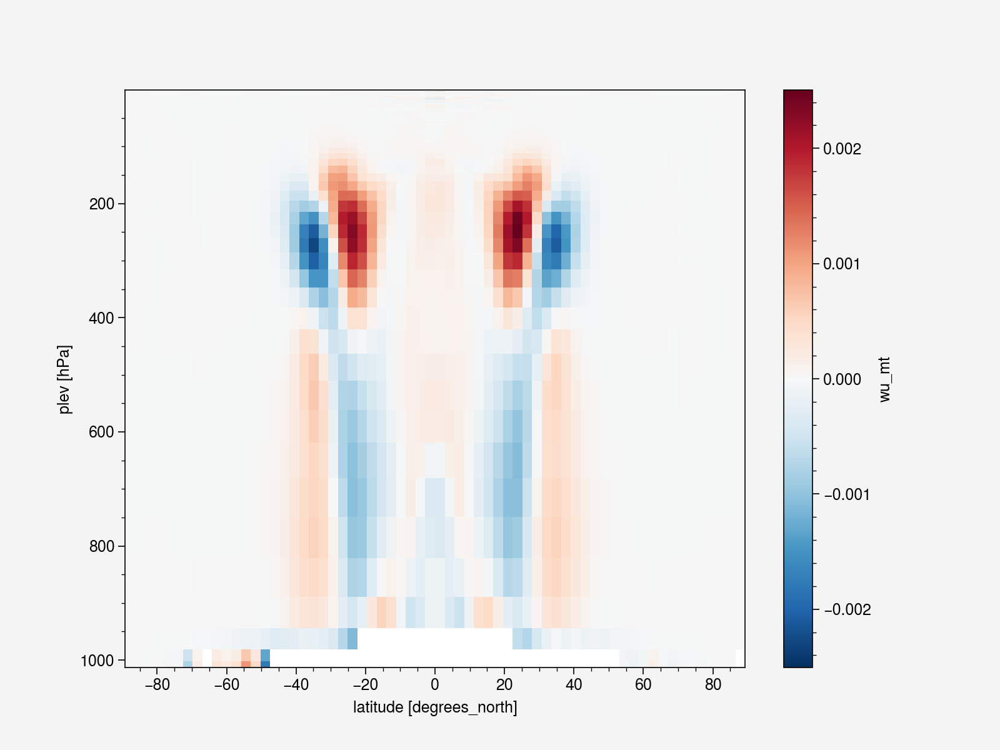

In [38]:
ds_tp.wu_mt.mean('time').differentiate('plev').plot()
plt.ylim(ylims)

## Transports

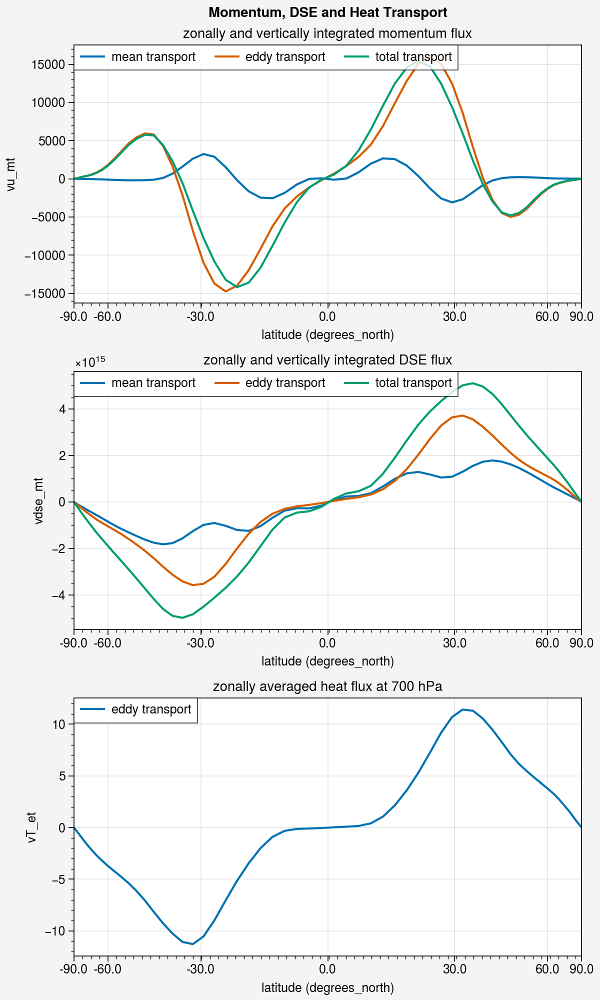

In [39]:
fig, ax = plot_transports(ds_tp_int_ref)
fig.save(f'{ref_name}_fluxes.{plot_format}')

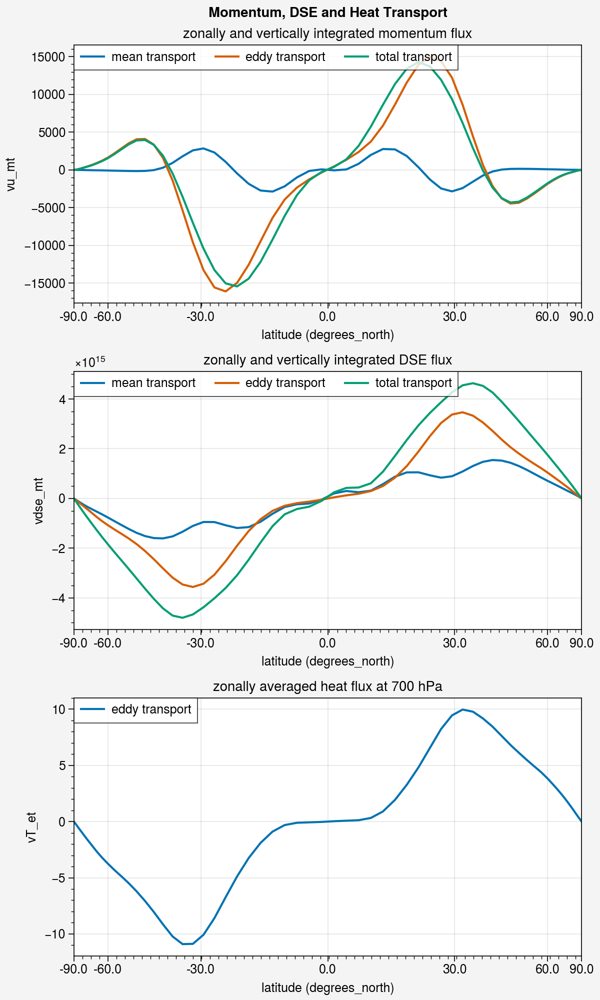

In [40]:
fig, ax = plot_transports(ds_tp_int)
fig.save(f'{exp_name}_fluxes.{plot_format}')

In [28]:
ds_tp_int.vT_et

<xarray.DataArray 'vT_et' (time: 366, lat: 64)>
array([[ 0.009684,  0.024337,  0.016348, ..., -0.071888, -0.048599, -0.015748],
       [ 0.004443,  0.007349,  0.011343, ..., -0.028165, -0.032493, -0.010449],
       [ 0.006166,  0.022888,  0.043606, ..., -0.00772 , -0.026238, -0.011229],
       ...,
       [ 0.01059 ,  0.019786,  0.146191, ..., -0.035411, -0.054463, -0.009884],
       [ 0.015107,  0.0366  ,  0.101268, ...,  0.011068, -0.005445, -0.00348 ],
       [ 0.020621,  0.083042,  0.157853, ..., -0.024202,  0.020346,  0.001963]])
Coordinates:
  * time     (time) datetime64[ns] 2000-01-01 2000-01-02 ... 2000-12-31
  * lat      (lat) float32 87.86 85.1 82.31 79.53 ... -79.53 -82.31 -85.1 -87.86
    plev     int64 ...

## Horizontal Fields

In [4]:
ds_pls_ref

<xarray.Dataset>
Dimensions:   (time: 366, plev: 5, lat: 32, lon: 128)
Coordinates:
  * time      (time) datetime64[ns] 2000-01-01 2000-01-02 ... 2000-12-31
  * lon       (lon) float32 0.0 2.812 5.625 8.438 ... 348.8 351.6 354.4 357.2
  * plev      (plev) float32 204.4 300.0 485.8 713.7 857.2
  * lat       (lat) float32 87.86 85.1 82.31 79.53 ... 9.767 6.977 4.186 1.395
Data variables:
    um1       (time, plev, lat, lon) float32 ...
    vm1       (time, plev, lat, lon) float32 ...
    vervel    (time, plev, lat, lon) float32 ...
    tm1       (time, plev, lat, lon) float32 ...
    aps       (time, lat, lon) float32 ...
    geopot_p  (time, plev, lat, lon) float32 ...
Attributes: (12/36)
    MESSy:                    MESSy version d2.55.2-858-ge3a4cbf06-dirty_e3a4...
    MESSy_switch:             version 1.0
    MESSy_channel:            version 2.4.4
    MESSy_tracer:             version 2.6
    MESSy_timer:              version 0.1
    MESSy_qtimer:             version 3.0
    ...                       ...
    operating_user:           Pablo Conrat Fuentes (b381739)
    channel_io_pe:            0
    channel_time_slo:         0.0
    channel_name:             vaxtra
    channel_file_type:        output
    channel_netcdf_lib:       4.8.1 of Feb 16 2022 21:18:58 $

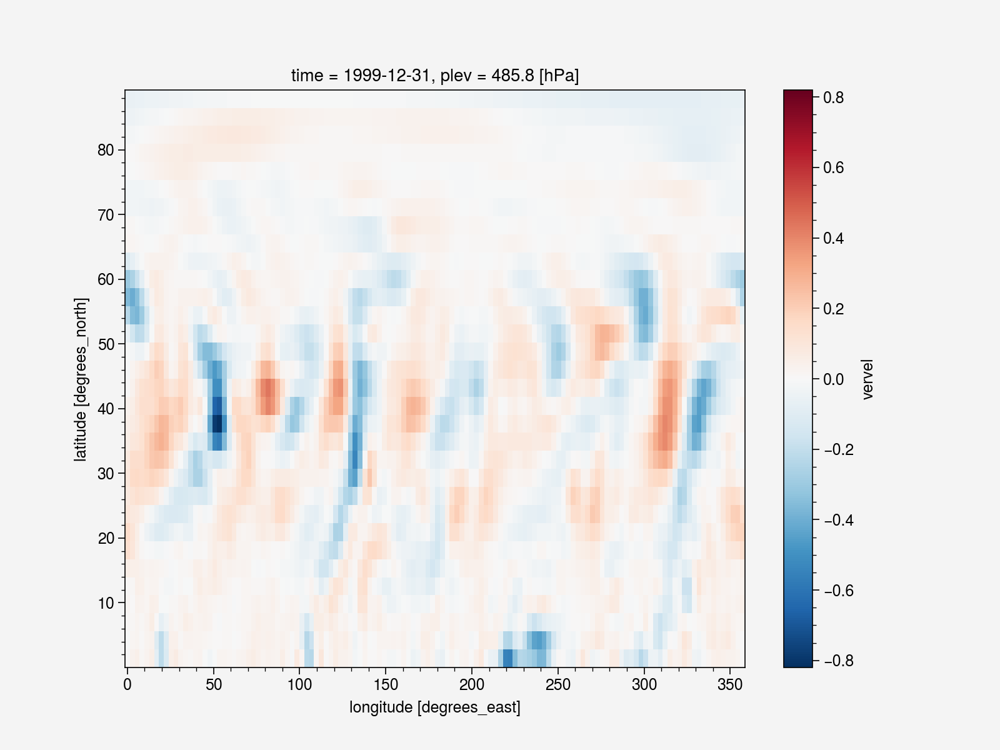

In [20]:
ds_pls.vervel.sel(plev=500, method='nearest', time='2000-03-01').plot()
plt.savefig(f'{exp_name}_vervel_snapshot.{plot_format}')

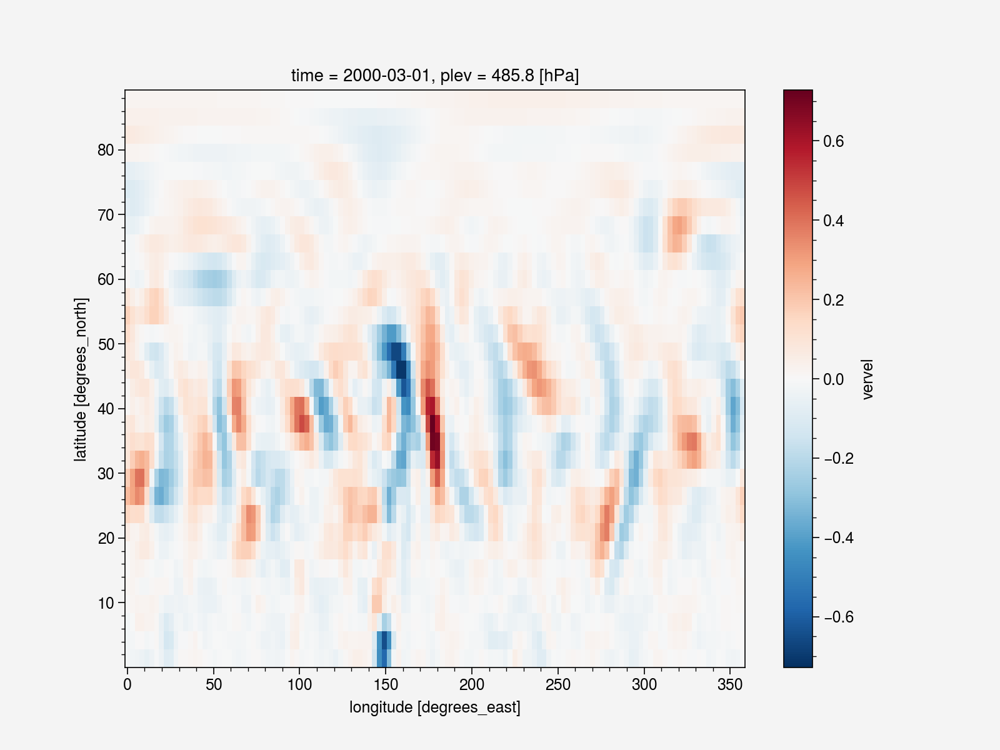

In [14]:
ds_pls_ref.vervel.sel(plev=500, method='nearest', time='2000-03-01').plot()
plt.savefig(f'{ref_name}_vervel_snapshot.{plot_format}')

(Figure(nrows=1, ncols=5, refwidth=2.5),
 SubplotGrid(nrows=1, ncols=5, length=5))

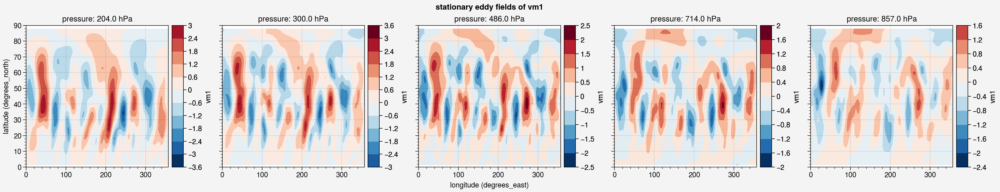

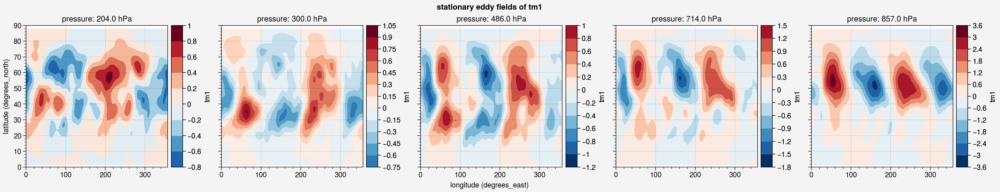

In [7]:
def plot_hor_fields(ds, variable, savefig=False, anom=False, fig=None, ax=None):
    
    nlevs = ds.plev.size
    if fig is None:
        fig, ax = pplt.subplots(ncols=nlevs)
        
    
    for i in range(nlevs):
        if anom:
            ax[i].contourf(ds.lon, ds.lat, (ds[variable].isel(plev=i) - ds[variable].isel(plev=i).mean(['lon'])).mean('time') , colorbar='r')
            fig.suptitle(f'stationary eddy fields of {variable}')
        else:
            ax[i].contour(ds.lon, ds.lat, ds[variable].isel(plev=i).mean('time'), color='black')
            fig.suptitle(f'stationary fields of {variable}')
            
        ax[i].set_ylim([0,90])
        ax[i].set_title(f'pressure: {np.round(ds.plev.values[i], 0)} hPa')
        
    if savefig:
        fig.savefig(f'{exp_name}_{variable}stat_eddy_fields.{plot_format}')
    return fig, ax

plot_hor_fields(ds_pls, 'vm1',anom=True)
plot_hor_fields(ds_pls, 'tm1',anom=True)

#fig, ax = plot_hor_fields(ds_pls, 'geopot_p')
#plot_hor_fields(ds_pls, 'um1',anom=True, fig=fig, ax=ax, savefig=False)


(Figure(nrows=1, ncols=5, refwidth=2.5),
 SubplotGrid(nrows=1, ncols=5, length=5))

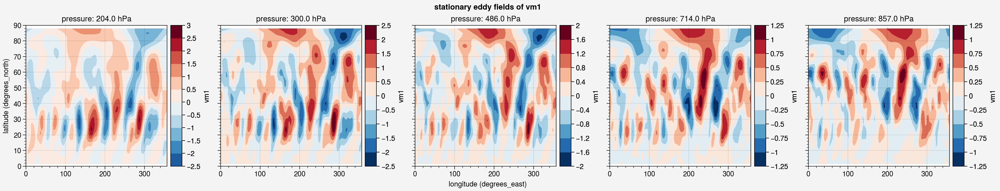

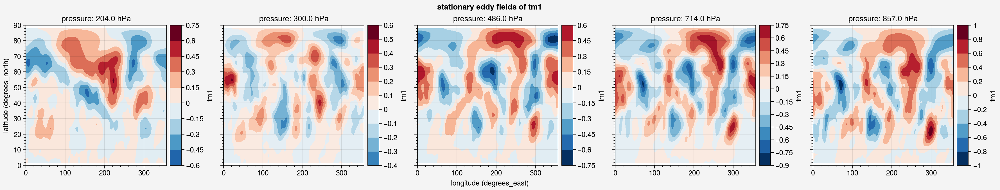

In [8]:
plot_hor_fields(ds_pls_ref, 'vm1',anom=True)
plot_hor_fields(ds_pls_ref, 'tm1',anom=True)

In [ ]:
 
ds_va_samples = ds_va.resample(time='180D', closed='left', label='left')
#ds_va_samples = ds_va_samples.where(ds_va_samples.count() >= 180)
n_samples = ds_va_samples.count().time.size
hayashi_spectra = np.zeros([n_samples, k, w*2+1])
i = 0
for t,ds in ds_va_samples:
    if ds.time.size != 180:
        continue
    hayashi_spectra[i] = compute_hayashi_spectra(ds.values, k, w)
    i += 1
    
ks = np.arange(k)
ws = np.arange(-w, w+1, 1)
freqs = (ws * 2*np.pi) / 180 # 1/d

da_hs = xr.DataArray(hayashi_spectra,
                     dims=['time', 'k', 'f'],
                     coords=dict(k = (['k'], ks),
                                 f = (['f'], freqs),
                                 time = (['time'], ds_va_samples.count().time.data))
                    )
da_hs.mean('time').rolling({'k':3}).mean()

numpy.datetime64('2000-08-03T00:00:00.000000000')

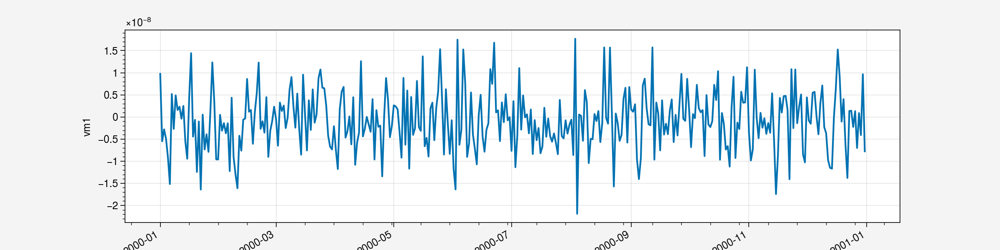

In [81]:
variable = 'vm1'
ds = ds_pls.sel(time=slice('2000','2002'))
ds_ea = ds[variable] - ds[variable].mean(['lon'])
time_series = ds_ea.mean(['lat', 'plev', 'lon'])

time_series.plot(figsize=[12, 3])
plt.savefig(f'{exp_name}_{variable}_anom_timeseries.{plot_format}')
event_date = time_series.time.where(time_series == time_series.max(), drop=True).values[0]
event_date

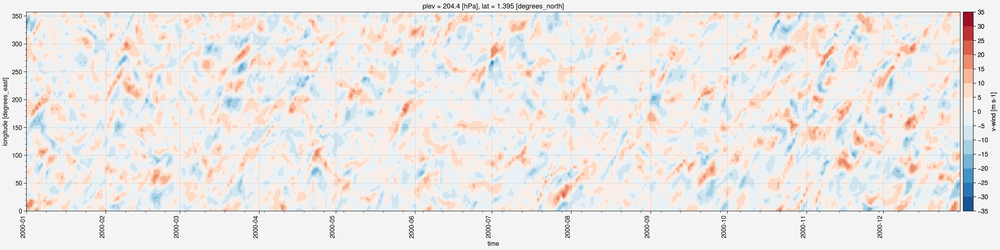

In [82]:
ds_sel = ds_pls.sel(lat=0, plev=100, method='nearest')
dt=300
fig, ax = pplt.subplots(figsize=(20,5))
variable='vm1'

ds_sel.sel(time=slice(event_date - np.timedelta64(dt, 'D'), event_date + np.timedelta64(dt, 'D')))[variable].T.plot.contourf(ax=ax, levels=15)
fig.savefig(f'{exp_name}_hovmoeller_tropics_{variable}.{plot_format}')

In [ ]:
ds = ds_pls.sel(lat=slice(25,0))
variable = 'um1'
variable2 = 'geopot_p'
res_freq = "QS-DEC"
res_freq = "3D"


var_sm = (ds[variable].isel(plev=0) - ds[variable].isel(plev=0).mean(['lon'])).resample(time=res_freq).mean()
var2_sm = (ds[variable2].isel(plev=0) - ds[variable2].isel(plev=0).mean(['lon'])).resample(time=res_freq).mean()

i = 0
nt = min(var_sm.time.size, 20)
fig, ax = pplt.subplots(figsize=(10,4*nt), nrows=nt, suptitle=f'{variable} anomaly fields, seasonal means')
for timestep in var_sm.time[-nt:]:
    ax[i].contourf(ds.lon, ds.lat, var2_sm.sel(time=timestep), levels=15, colorbar='right')
    ax[i].contour(ds.lon, ds.lat, var_sm.sel(time=timestep), levels=15, labels=True, color='black')

    ax[i].set_title(f'{timestep.values}'[:10])
    ax[i].set_ylim([0,20])
    i += 1

fig.savefig(f'{outpath}/{exp_name}_{variable}_anom_seasonal_means.{plot_format}')


## EP-Flux


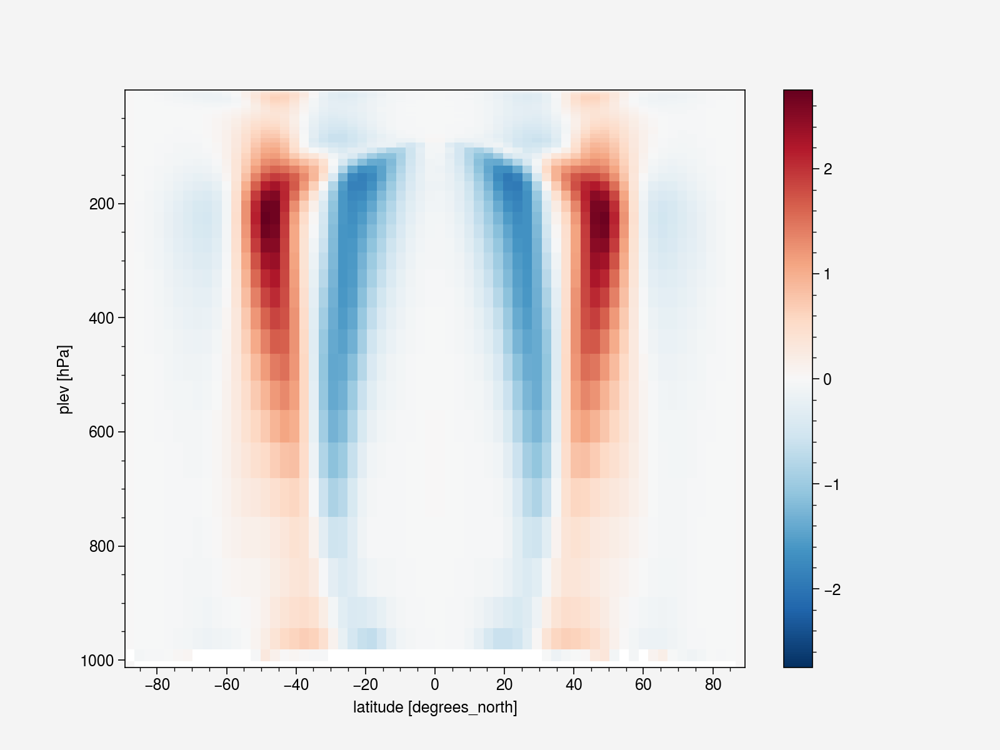

In [27]:
rho_0 = 1.225 # sea level density kg/m^3
f_0 = 2 * np.sin(np.radians(45)) * 7.292e-5 # Coriolis parameter at 45° latitude rad/s^-1
n = 1.2e-2 # Brunt-Väisälä frequency s^-1, strat: n^2 = 4e-4 s^-2
H = 10e3 # m
g = 9.81 # m s^-2

def ddy(phi, dy):
    dy_phi = (np.roll(phi,-1,axis=-1)-np.roll(phi,1,axis=-1))/(2*dy)
    dy_phi[...,0] = 0
    dy_phi[...,-1] = 0
    return dy_phi

def ddz(phi, dz):
    dz_phi = ((np.roll(phi,-1,axis=1) - np.roll(phi,1,axis=1))/(2*dz))
    dz_phi[0,:] = 0
    dz_phi[-1,:] = 0
    return dz_phi

dz = (np.roll(ds_zm.geopot_p.mean('time').values,-1) - np.roll(ds_zm.geopot_p.mean('time').values,1)) / g
dy = ds_tp.lat.values[1] - ds_tp.lat.values[0]
epf_y = - rho_0 * ds_tp.vu_et.mean('time')
epf_z = rho_0 * f_0 * 1/(n**2 * H) * ds_tp.vT_et.mean('time')
epf_div = ddy(epf_y.values, dy) + ddz(epf_z.values, dz)

ds_epf = xr.DataArray(epf_div, dims=['plev','lat'], 
                      coords=dict(
                          plev=ds_zm.plev,
                          lat=ds_zm.lat
                      )
                     )
ylims=[1013,1]
ds_epf.plot(ylim=ylims)

In [18]:
ds_zm.vervel

<xarray.DataArray 'vervel' (time: 731, plev: 90, lat: 64)>
array([[[-2.226776e-07, -1.970005e-07, ...,  3.210996e-07,  8.813572e-07],
        [-2.908097e-07, -6.438037e-07, ...,  9.291545e-07,  1.832896e-06],
        ...,
        [          nan,           nan, ...,           nan,           nan],
        [          nan,           nan, ...,           nan,           nan]],

       [[-1.767531e-07, -1.178476e-07, ..., -2.049157e-07, -3.912141e-07],
        [-2.271166e-07, -1.695863e-07, ..., -7.924052e-07, -9.828873e-07],
        ...,
        [          nan,           nan, ...,           nan,           nan],
        [          nan,           nan, ...,           nan,           nan]],

       ...,

       [[ 2.946333e-07, -4.530832e-08, ..., -5.452488e-08, -1.044020e-07],
        [ 2.369611e-07, -9.129819e-08, ..., -3.637016e-07, -4.891361e-07],
        ...,
        [          nan,           nan, ...,           nan,           nan],
        [          nan,           nan, ...,           nan,           nan]],

       [[ 5.267107e-07, -7.263914e-08, ..., -7.845216e-09, -2.043648e-08],
        [-3.093538e-07, -1.736570e-07, ..., -2.635754e-07, -9.202937e-07],
        ...,
        [          nan,           nan, ...,           nan,           nan],
        [          nan,           nan, ...,           nan,           nan]]],
      dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2000-01-01 2000-01-02 ... 2001-12-31
  * plev     (plev) float32 0.009946 0.03183 0.05808 ... 967.4 995.7 1.009e+03
  * lat      (lat) float32 87.86 85.1 82.31 79.53 ... -79.53 -82.31 -85.1 -87.86

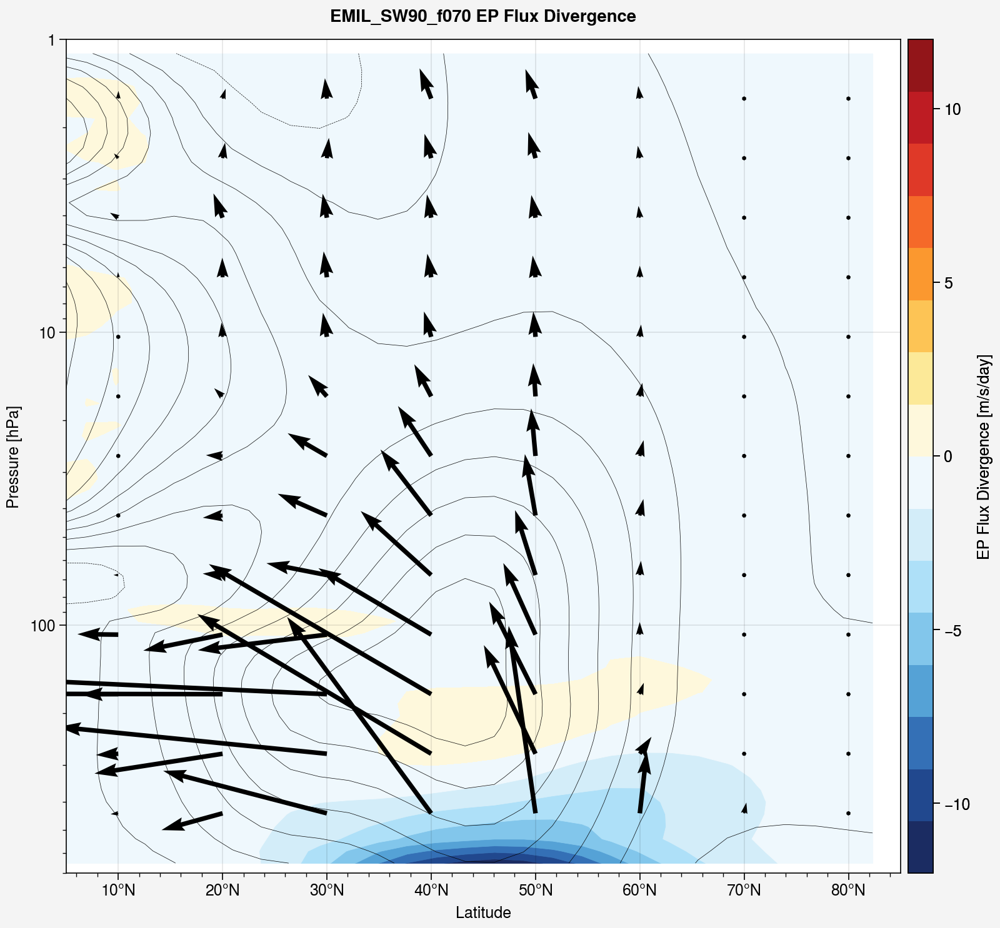

In [33]:
def plot_ep_flux_div(ds_transports, ds_zonalmean):
    # fluxes ohne cosinus
    uv = (ds_transports.vu_et).sel(plev=slice(1,700), lat=slice(85,0)).mean('time')
    #uw = (ds_transports.wu_et + ds_transports.wu_mt).sel(plev=slice(1,700), lat=slice(85,0)).mean('time') # auf hPa/s
    vt = (ds_transports.vT_et).sel(plev=slice(1,700), lat=slice(85,0)).mean('time')
    u = ds_zonalmean.um1.sel(plev=slice(1,700), lat=slice(85,0)).mean('time')
    t = ds_zonalmean.tm1.sel(plev=slice(1,700), lat=slice(85,0)).mean('time')

    omega = 2 * np.pi / (24 * 60 * 60)
    g = 9.81
    a = 6370000
    K = 2 / 7
    aspect_x = 1
    aspect_y = 1
    delta_phi = 85
    p_min = 1
    p_max = 700

    chi = vt / (t.differentiate("plev") - (K * t / t.plev))

    f_phi = (chi * u.differentiate("plev")) - uv 
    f_p = (
         chi
         * (
             (2 * omega * np.sin(np.deg2rad(t.lat)))
             - (
                 (u * np.cos(np.deg2rad(u.lat))).differentiate("lat")
                 * 180
                 / np.pi
                 / np.cos(np.deg2rad(t.lat))
                 / a
             )
         )
    ) #- uw

    F_phi = a * np.cos(np.deg2rad(f_phi.lat)) * f_phi 
    F_p = a * np.cos(np.deg2rad(f_p.lat)) * f_p

    ep_flux_phi = (
         2 * np.pi * a ** 2 * np.cos(np.deg2rad(f_phi.lat)) ** 2 * f_phi / g
    ).transpose()
    ep_flux_p = (
         2 * np.pi * a ** 3 * np.cos(np.deg2rad(f_p.lat)) ** 2 * f_p / g
    ).transpose()

    ep_div = (
         (
             (F_phi * np.cos(np.deg2rad(F_phi.lat))).differentiate("lat")
             * 180
             / np.pi
             / a
             / np.cos(np.deg2rad(F_phi.lat))
         )
         + (F_p.differentiate("plev"))
    ).transpose()


    p_equ = 10 ** np.linspace(np.log10(p_min), np.log10(p_max), 15)

    ep_flux_phi_plot = (ep_flux_phi * aspect_x * 180 / aspect_y / delta_phi / np.pi).interp(
         plev=p_equ, lat=np.linspace(80, 10, 8)
    )
    ep_flux_p_plot = (ep_flux_p / ep_flux_p.plev / np.log(p_min / p_max)).interp(
         plev=p_equ, lat=np.linspace(80, 10, 8)
    )


    fig, ax = pplt.subplots(figwidth=8)  # aspect=(aspect_y/aspect_x),
    ax.contour(u, color="black", lw=0.25) 
    ax.contourf(
         24 * 3600 * ep_div / a / np.cos(np.deg2rad(ep_div.lat)),
         levels=16, #np.arange(-40,40.1,10),
         cmap="ColdHot",
         norm="diverging",
         symmetric=True,
         colorbar="r",
         colorbar_kw={"ticks": "auto", "label": "EP Flux Divergence [m/s/day]"},
    )
    ax.quiver(
         ep_flux_phi_plot,
         ep_flux_p_plot,
         pivot="tail",
         units="xy",
         angles="uv",
    )
    ax.format(
         xlabel="Latitude",
         xformatter="deglat",
         ylabel="Pressure [hPa]",
         ylim=(p_min, p_max),
         yscale="log",
         yreverse=True,
         xlim=(5,85),
    )
    return fig, ax

fig, ax = plot_ep_flux_div(ds_tp, ds_zm)

fig.suptitle(f'{exp_name} EP Flux Divergence')
fig.savefig(f'{exp_name}_ep_flux_div.{plot_format}')

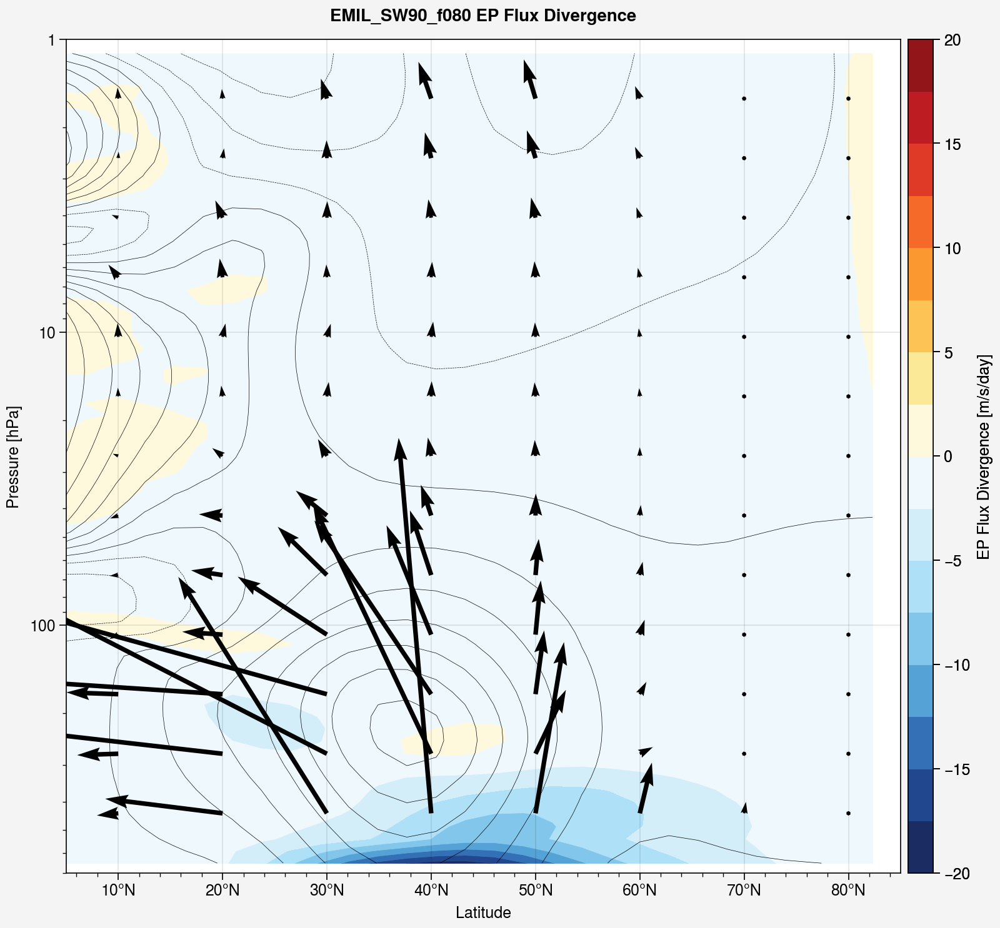

In [34]:
fig, ax = plot_ep_flux_div(ds_tp_ref, ds_zm_ref)

fig.suptitle(f'{ref_name} EP Flux Divergence')
fig.savefig(f'{ref_name}_ep_flux_div.{plot_format}')

In [ ]:
ds_tp

In [ ]:
fig, ax = pplt.subplots()
ax.contourf(ds_tp.plev.values, ds_tp.lat.values, epf_div)

In [ ]:
epf_y

## Convergence


In [ ]:
def convergence_time_means(ts):
    ts_conv = [np.mean(ts[:i]) for i in np.arange(1,ts.size, 1)]
    return ts_conv - ts_conv[-1]

lon = 50
lat = 45
plev = 800
var = 'tm1'

ts_conv_t = convergence_time_means(ds_pls[var].sel(lat=lat, lon=lon, plev=plev, method='nearest').values)
fig, ax = pplt.subplots(figsize=(12,4))
ax.plot(ds_pls.time[1:], ts_conv_t)
ax.set_title(f'cumulative time means minus total time mean over {var} at {lat}°N, {lon}°W, and {plev}')

In [ ]:

n_samples = 100
lat, lon, plev = np.random.randint(np.array([ds_pls.lat.size, ds_pls.lon.size, ds_pls.plev.size]), size=(n_samples, 3)).T

fig, ax = pplt.subplots(figsize=(12,8), nrows=2)

for j in range(n_samples):

    sel = ds_pls[var].isel(lat=lat[j], lon=lon[j], plev=plev[j]).values
    ts_conv_t = convergence_time_means(sel)
    ax[0].plot(ds_pls.time[1:], ts_conv_t)
    ax[1].plot(ds_pls.time[1:], sel[1:] - sel[-1])
    
ax[0].set_title(f'cumulative time means normalized to last value of temperature at various locations')
ax[1].set_title(f'time evolution of temperature at various locations')
fig.savefig(f'{exp_name}_convergence.{plot_format}')

In [ ]:
R = 287.0 # J kg^-1 K^-1
t_i = (ds_zm.tm1.isel(plev=slice(1,ds_zm.plev.size)) + ds_zm.tm1.isel(plev=slice(0,ds_zm.plev.size-1)).values)/2
p_i = (ds_zm.plev.isel(plev=slice(1,ds_zm.plev.size)) + ds_zm.plev.isel(plev=slice(0,ds_zm.plev.size-1)).values)/2
dp = ds_zm.plev.values[:-1] - ds_zm.plev[1:]
gp = (- R*t_i/p_i * dp).reindex(plev=ds_zm.plev[::-1]).cumsum(dim='plev').reindex(plev=ds_zm.plev)

ylims=[1013,1]
fig, ax = pplt.subplots()
ax.contour(gp.sel(plev=slice(100,1000)).mean('time'), colorbar='right')
ax.set_ylim(ylims)

In [ ]:
fig, ax = pplt.subplots()
ax.contour((ds_zm.geopot_p.sel(plev=slice(100,1000))/9.81).mean('time'), colorbar='right')
ax.set_ylim(ylims)

In [ ]:
fig, ax = pplt.subplots()
ax.contourf(gp.sel(plev=slice(100,1000)).mean('time') - ds_zm.sel(plev=slice(100,1000)).geopot_p.mean('time'), colorbar='right', contours=15)
ax.set_ylim(ylims)

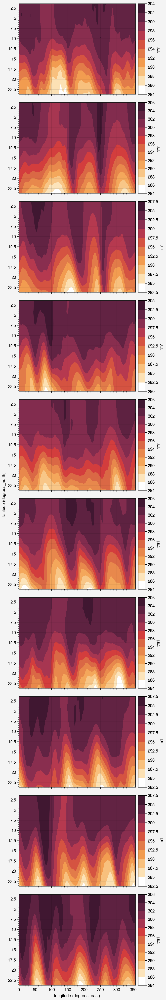

In [9]:
ds = ds_pls.sel(plev=ds_pls.plev[-1], lat=slice(25,0)).resample(time='1W').mean('time')
n = 10
fig, ax = pplt.subplots(figsize=(5,30), nrows=n)

for i in range(10):
    ax[i].contourf(ds.lon, ds.lat, ds.tm1.isel(time=i), colorbar='r')

NameError: name 'setup_ref' is not defined

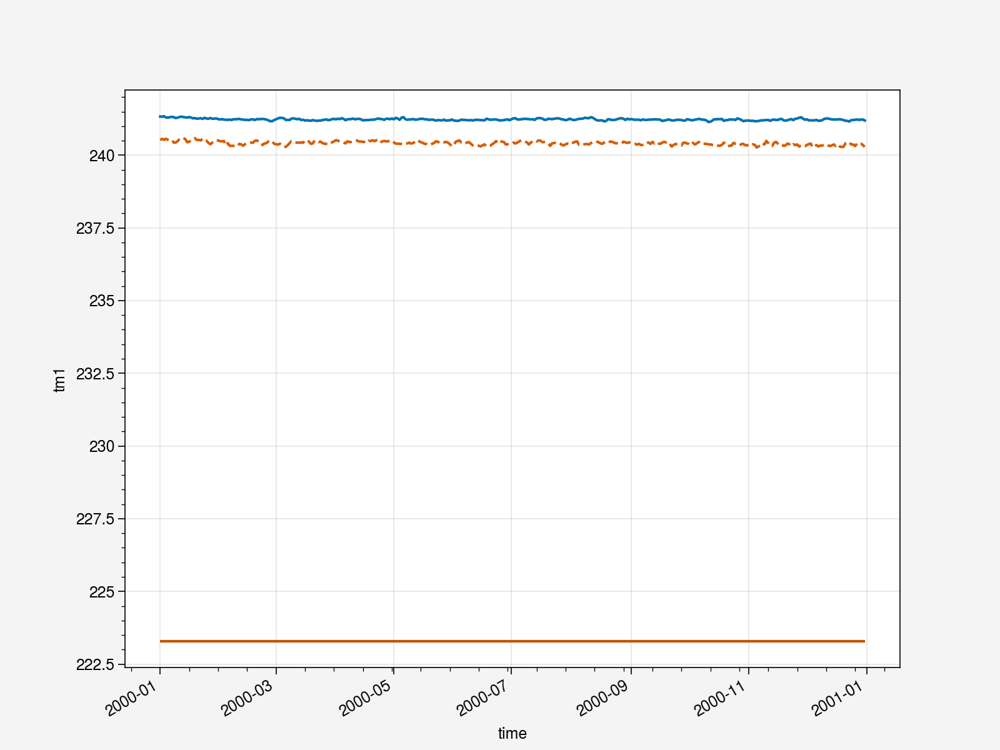

In [5]:
ds = ds_zm
ds2 = ds_zm_ref #.sel(time=slice('2000-01-01', '2001-12-29'))

ds.tm1.weighted(total_weights).mean(['lat', 'plev']).plot(label=f'{exp_name}')
plt.plot(ds.time, ds2.tm1.weighted(total_weights).mean(['lat', 'plev']), linestyle= '--', label=f'{ref_name}')
plt.hlines(t_equ.weighted(total_weights).mean(), xmin=ds.time[0], xmax=ds.time[-1], color='dark orange', label=f'T_equ {setup}')
plt.hlines(t_equ_ref.weighted(total_weights).mean(), xmin=ds.time[0], xmax=ds.time[-1], color='dark blue', label=f'T_equ {setup_ref}')
plt.title('global mean temperature')
plt.legend()
plt.savefig(f'{ref_name}_evolution_global_mean_temperature.{plot_format}')

In [ ]:
nlevs = ds_zm.plev.size
# buoyancy frequency calculation
dtheta_ver = ds_zm.theta.isel(plev=slice(2,nlevs)) - ds_zm.theta.isel(plev=slice(0,nlevs-2)).values
dz = - ds_zm.geopot_p.isel(plev=slice(2,nlevs))/g0 + ds_zm.geopot_p.isel(plev=slice(0,nlevs-2)).values/g0

ds_sel = ds_zm.isel(plev=slice(1,nlevs-1))
        
dtheta_dz = xr.DataArray(dtheta_ver/dz, dims=['time','plev','lat'], 
                         coords=dict(
                             plev=ds_sel.plev,
                             lat=ds_sel.lat,
                             time=ds_sel.time))

ds_zm['n_sq'] = g0 / ds_zm.theta * (dtheta_dz)